# QC and annotation using scanpy and associated tools

## Description
This notebook performs some basic QC, normalisation, and cell annotation for a scRNA-seq dataset of cells isolated from the developing cerebellum of mice which are either WT and or mutant for a TF we think is important in cerebellar development. We will base our analysis in the Python scVerse (e.g. Scanpy), but will use some tools from R also. A lot of the inspiration for this notebook came from www.sc-best-practices.org. 

Import necesssary packages and set some settings

In [1]:
import os
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import seaborn as sns
from scipy.stats import median_abs_deviation
import scipy.io as sio
import logging
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
import decoupler as dc
import warnings
import random

#Ignore some warnings we don't need
warnings.simplefilter(action='ignore', category=FutureWarning)

#Set scanpy settings for warnings and images
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (3, 3)
sc.logging.print_header()

#Make necessary folders
os.makedirs("analysis/plots/annotation/", exist_ok = True) 
os.makedirs("markerGenes", exist_ok = True) 
#Set random seed for reproducibility
random.seed(123)

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/numba/core/cpu.py:99: UserWarning: Numba extension module 'sparse._numba_extension' failed to load due to 'ModuleNotFoundError(No module named 'numba.targets')'.
  numba.core.entrypoints.init_all()


scanpy==1.9.6 anndata==0.10.3 umap==0.5.4 numpy==1.24.4 scipy==1.11.3 pandas==2.1.1 scikit-learn==1.3.2 statsmodels==0.14.0 igraph==0.10.8 pynndescent==0.5.10


In [2]:
import anndata2ri
import rpy2.rinterface_lib.callbacks as rcb
import rpy2.robjects as ro
import anndata2ri
from rpy2.robjects import r

- Project '~/bioinformatics/projects/DaniSC/code/analysis' loaded. [renv 1.0.2]

NOTE: Dependency discovery took 670 seconds during snapshot.
Consider using .renvignore to ignore files, or switching to explicit snapshots.
See `?renv::dependencies` for more information.


Warning messages:
1: In file(file, "rt") :
  cannot open file '/usr/lib/R/doc/CRAN_mirrors.csv': No such file or directory
2: In file(file, "rt") :
  cannot open file '/usr/lib/R/doc/CRAN_mirrors.csv': No such file or directory
3: In file(file, "rt") :
  cannot open file '/usr/lib/R/doc/CRAN_mirrors.csv': No such file or directory
4: In file(file, "rt") :
  cannot open file '/usr/lib/R/doc/CRAN_mirrors.csv': No such file or directory
5: In file(file, "rt") :
  cannot open file '/usr/lib/R/doc/CRAN_mirrors.csv': No such file or directory
6: In file(file, "rt") :
  cannot open file '/usr/lib/R/doc/CRAN_mirrors.csv': No such file or directory


## Load and QC data

First we create a merged AnnData object from geneXcell count matrices output by CellBender.

In [3]:
adataWT = sc.read_10x_h5("WT_CellbenderOutput_filtered.h5")
adataWT.var_names_make_unique()
adataWT.obs["ID"] = np.repeat("WT", adataWT.n_obs, axis=0)
adataKO = sc.read_10x_h5("KO_CellbenderOutput_filtered.h5")
adataKO.var_names_make_unique()
adataKO.obs["ID"] = np.repeat("KO", adataKO.n_obs, axis=0)
adata = ad.concat([adataWT, adataKO])
adata.obs_names_make_unique()
del adataWT, adataKO
adata.X

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/anndata/_core/anndata.py:1899: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/anndata/_core/anndata.py:1899: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/anndata/_core/anndata.py:1899: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/anndata/_core/anndata.py:1899: UserWarning: Variable names are not unique. To make them unique, call `.var_names_mak

<19869x32165 sparse matrix of type '<class 'numpy.int64'>'
	with 56571839 stored elements in Compressed Sparse Row format>

Peak at the sample metadata - it's just the sample ID for now

In [4]:
adata.obs

,ID
GCTGCAGGTTCTAAGC,WT
CTCAAGACATTCCTAT,WT
GCAGCTGTCACCATCC,WT
CGAGTGCAGTGGTCAG,WT
CTGCGAGGTCAGTTTG,WT
...,...
CTGCAGGCATTCACAG,KO
AGTGCCGGTTGGGTTT,KO
CAGCAATCATTGTAGC,KO
TTGTTGTTCCTAGCGG,KO


### Quality Control

Show the highest expressed genes - are they dominating counts?

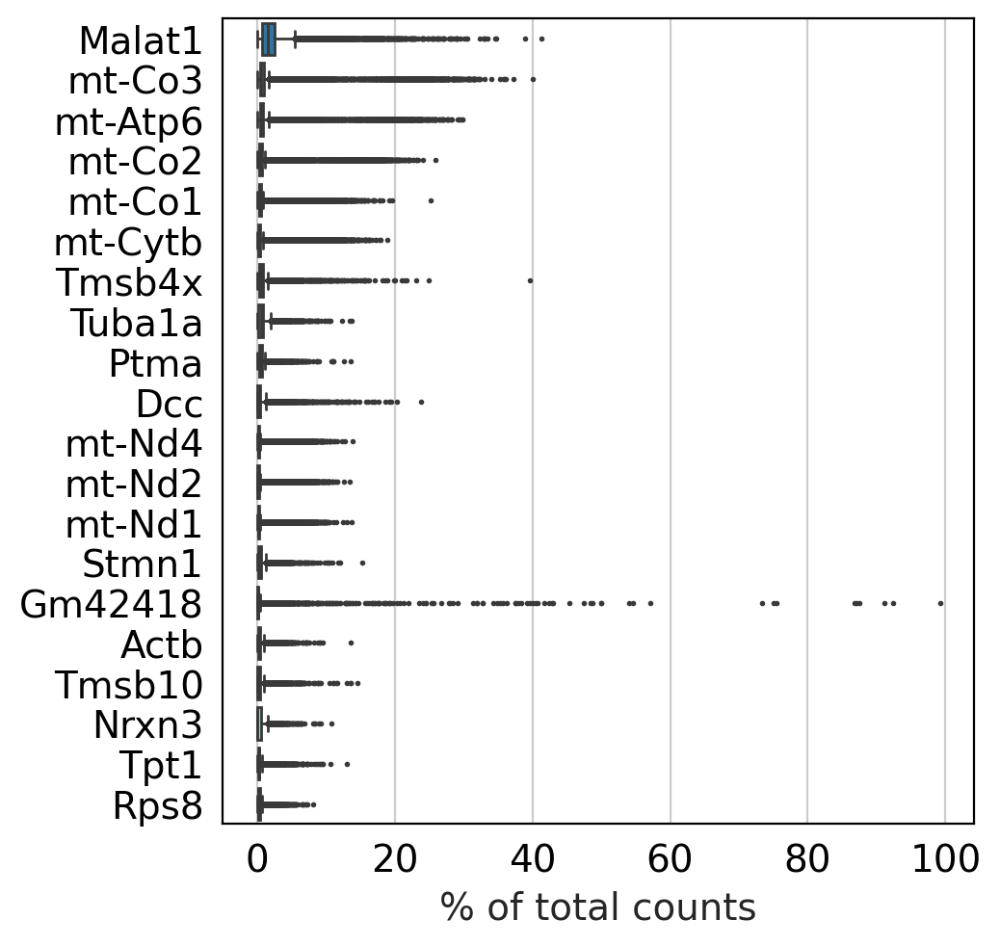

In [5]:
sc.pl.highest_expr_genes(adata, n_top=20)

Calculate percentage of mitochondrial, ribosomal, and haemoglobin genes

In [6]:
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("mt-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("Rps", "RPpl"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains(("^hb[^(P)]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
adata

AnnData object with n_obs × n_vars = 19869 × 32165
    obs: 'ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

Plot the three QC covariates n_genes_by_counts, total_counts and pct_counts_mt per sample to assess how well the respective cells were captured.

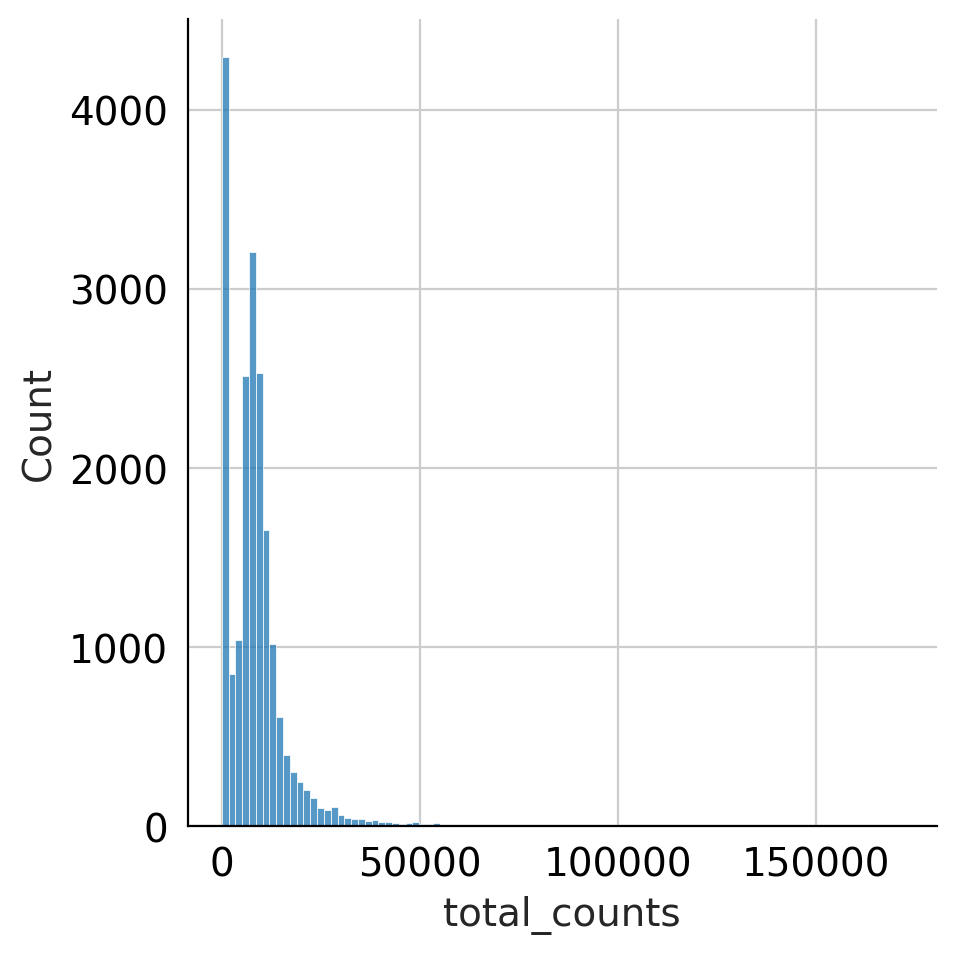

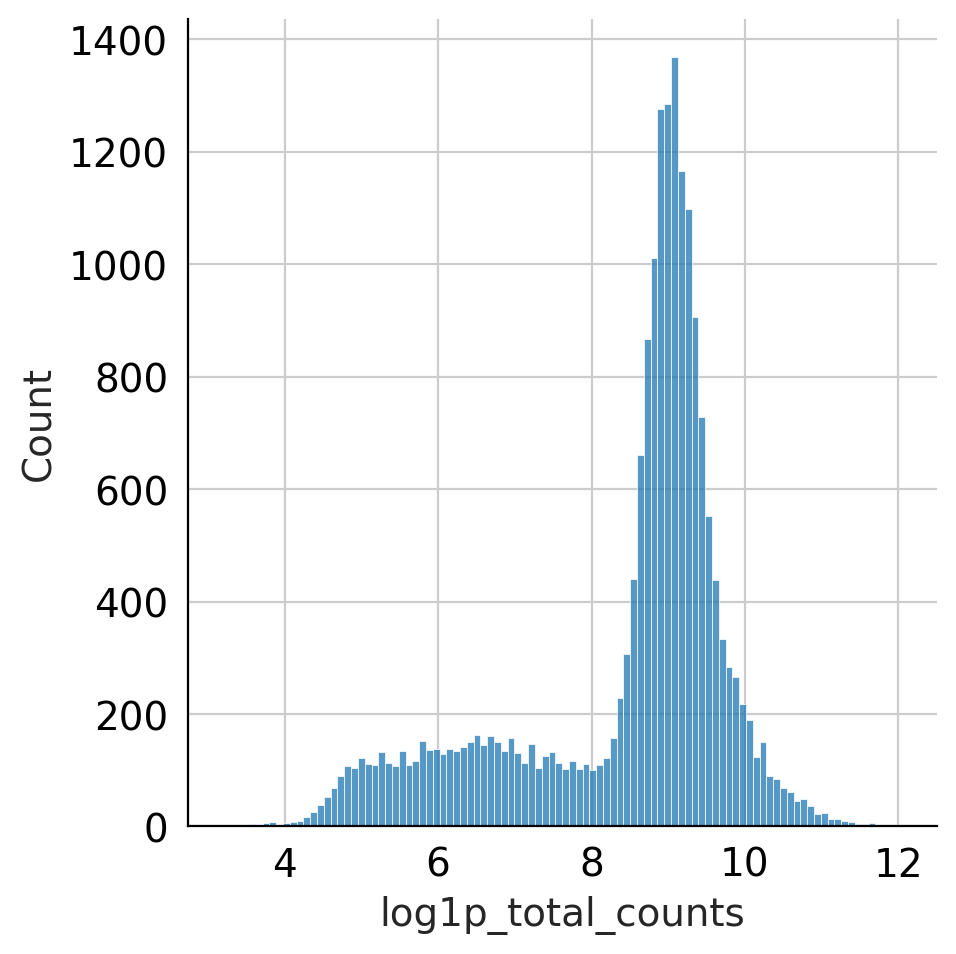

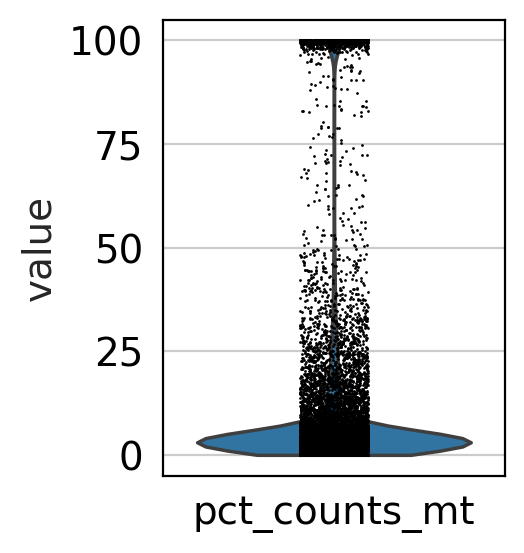

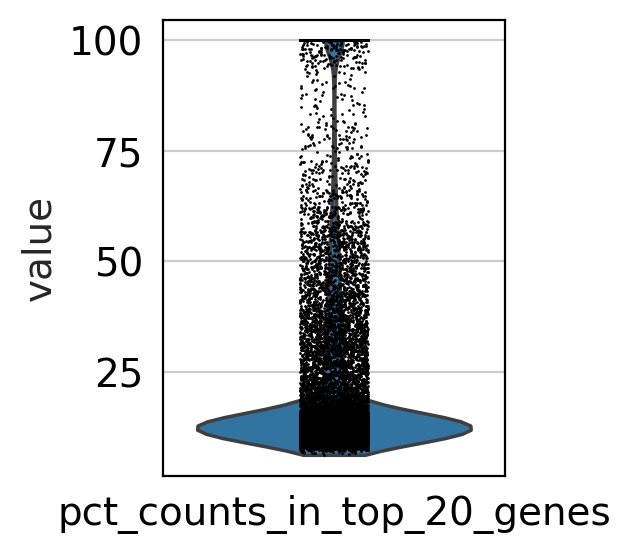

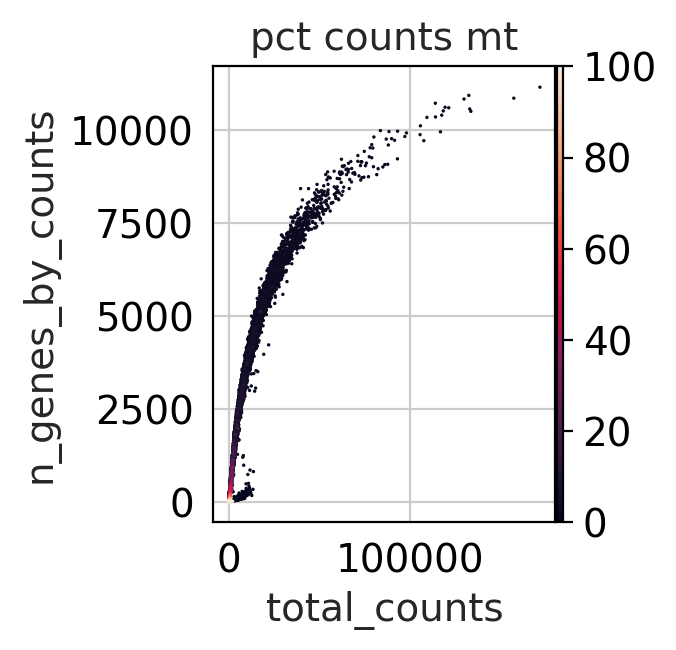

In [7]:
p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)
p2 = sns.displot(adata.obs["log1p_total_counts"], bins=100, kde=False)
p3 = sc.pl.violin(adata, "pct_counts_mt")
p4 = sc.pl.violin(adata, "pct_counts_in_top_20_genes")
p5 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

Filter out bad quality cells

In [8]:
adata.obs["outlier"] = (
    (adata.obs["log1p_total_counts"] < 8.25) |
    (adata.obs["n_genes_by_counts"] < 1000) |
    (adata.obs["pct_counts_in_top_20_genes"] > 17)
)

adata.obs["mt_outlier"] = (
    adata.obs["pct_counts_mt"] > 10
)

In [9]:
adata.obs.outlier.value_counts()

outlier
False    14245
True      5624
Name: count, dtype: int64

In [10]:
adata.obs.mt_outlier.value_counts()

mt_outlier
False    17057
True      2812
Name: count, dtype: int64

Filter our AnnData object based on these two outlier columns

In [11]:
print(f"Total number of cells: {adata.n_obs}")
adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")

Total number of cells: 19869
Number of cells after filtering of low quality cells: 14243


### Doublet Detection

We will use scDblFinder to remove potential doublets (two or more cells sequenced within one droplet, so share the same cell barcode). scDblFinder randomly selects two droplets and creates artificial doublets from those by averaging their gene expression profiles. The doublet score is then defined as the fraction of artificial doublets in the k-nearest neighbor graph of each droplet in the principal component space.

[Xi and Li, 2021] benchmarked nine different doublet detection methods and assessed their performance with respect to computational efficiency and doublet detection accuracy. They additionally assessed scDblFinder in an addendum to their benchmark which achieved the highest doublet detection accuracy and a good computational efficiency and stability [Xi and Li, 2021].

First find deviant features using the R package scry

In [12]:
#First convert some datatypes not accepted in R
adata.obs.total_counts = adata.obs.total_counts.astype(np.int32)
adata.obs.total_counts_mt = adata.obs.total_counts_mt.astype(np.int32)
adata.obs.total_counts_ribo = adata.obs.total_counts_ribo.astype(np.int32)
adata.X = csr_matrix(adata.X, dtype=np.float32)

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

/tmp/ipykernel_14915/1680729414.py:9: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()


In [13]:
%%R
library(scry)

In [14]:
#Save adata object into our global environment
ro.globalenv["adata"] = adata

In [15]:
%%R
sce = devianceFeatureSelection(adata, assay="X")

Sort the vector and select the top 2,000 highly deviant genes and save them as an additional column in .var as ‘highly_deviant’. We additionally save the computed binomial deviance in case we want to sub-select a different number of highly variable genes afterwards.

In [17]:
binomial_deviance = ro.r("rowData(sce)$binomial_deviance").T
idx = binomial_deviance.argsort()[-2000:]
mask = np.zeros(adata.var_names.shape, dtype=bool)
mask[idx] = True

adata.var["highly_deviant"] = mask
adata.var["binomial_deviance"] = binomial_deviance

Normalise data and plot the variable genes

In [18]:
adata.layers["counts"] = adata.X.copy() # preserve counts
sc.pp.normalize_total(adata, target_sum=1e4) # scale each cell to a common library size
sc.pp.log1p(adata) # log(expression + 1)
sc.pp.highly_variable_genes(adata)

Plot dispersion versus mean for the genes and color by ‘highly_deviant’ - ideally our highly deviant genes will have high means

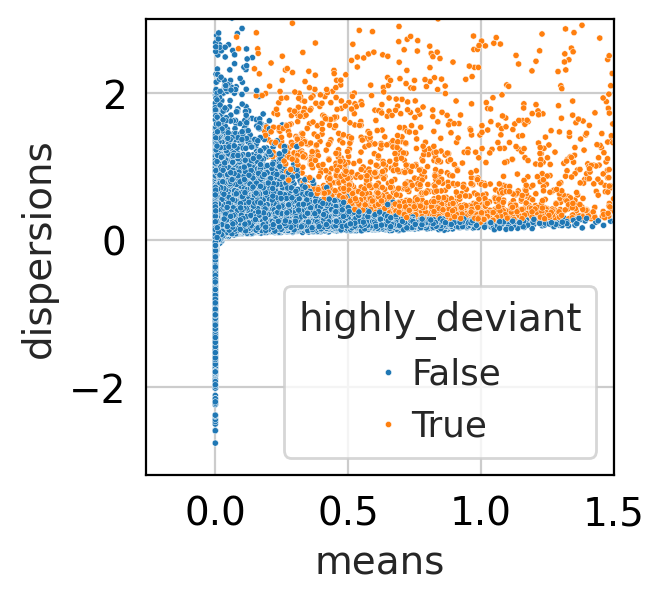

In [20]:
ax = sns.scatterplot(
    data=adata.var, x="means", y="dispersions", hue="highly_deviant", s=5
)
ax.set_xlim(None, 1.5)
ax.set_ylim(None, 3)
plt.show()

PCA and find nearest neighbours

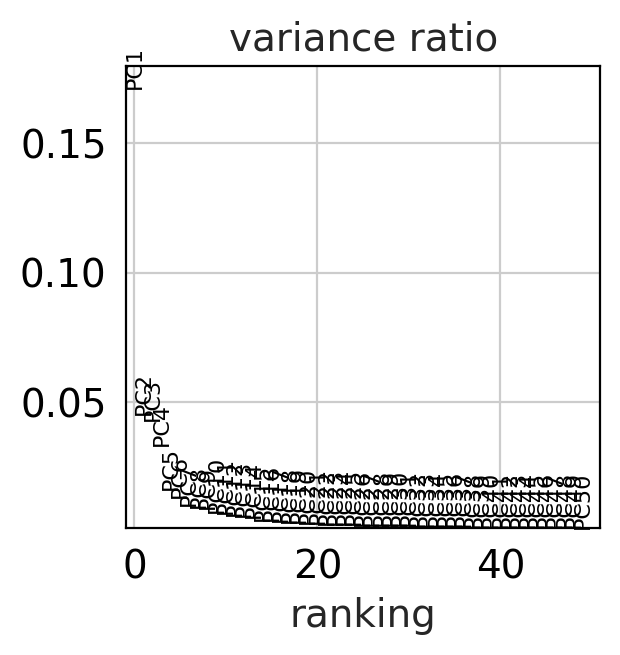

In [21]:
adata.var["highly_variable"] = adata.var["highly_deviant"]
sc.tl.pca(adata, svd_solver="arpack", use_highly_variable=True)
sc.pl.pca_variance_ratio(adata, n_pcs=50)

#### Now detect doublets with scDblFinder in R

Return to raw counts

In [22]:
adata.X = adata.layers["counts"]
del adata.layers["counts"]

Doublet detection

In [23]:
%%R
library(Seurat)
library(scater)
library(scDblFinder)
library(BiocParallel)


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

Loading required package: SeuratObject
Loading required package: sp

Attaching package: ‘sp’

The following object is masked from ‘package:IRanges’:

    %over%

‘SeuratObject’ was built under R 4.3.0 but the current version is
4.3.1; it is recomended that you reinstall ‘SeuratObject’ as the ABI
for R may have changed

Attaching package: ‘SeuratObject’

The following object is masked from ‘package:SummarizedExperiment’:

    Assays

The following object is masked from ‘package:GenomicRanges’:

    intersect

The following object is masked from ‘package:GenomeInfoDb’:

    intersect

The following object is masked from ‘package:IRanges’:

    intersect

The following object is masked from ‘package:S4Vectors’:

    intersect

The following object is masked from ‘package:BiocGenerics’:

    intersect

The following object is masked from ‘package:base’:

    intersect


Attaching package: ‘Seurat’

The following object is masked from ‘package:SummarizedExperiment’:

    Assays

Loading req

In [24]:
data_mat = adata.X.T
cellData = adata.obs

In [25]:
%%R -i data_mat -i cellData -o doublet_score -o doublet_class

set.seed(123)
sce = scDblFinder(
    SingleCellExperiment(
        list(counts=data_mat),
        colData=cellData
    ) ,
        samples = "ID", includePCs = 9
)
doublet_score = sce$scDblFinder.score
doublet_class = sce$scDblFinder.class

In [26]:
adata.obs["scDblFinder_score"] = doublet_score
adata.obs["scDblFinder_class"] = doublet_class
adata.obs.scDblFinder_class.value_counts()

scDblFinder_class
singlet    12562
doublet     1681
Name: count, dtype: int64

Remove doublets

In [27]:
adata = adata[adata.obs['scDblFinder_class'] == "singlet", :]

## Cluster and visualise

Refind deviant features using the R package scry

In [28]:
#First convert some datatypes not accepted in R
adata.obs.total_counts = adata.obs.total_counts.astype(np.int32)
adata.obs.total_counts_mt = adata.obs.total_counts_mt.astype(np.int32)
adata.obs.total_counts_ribo = adata.obs.total_counts_ribo.astype(np.int32)
adata.X = csr_matrix(adata.X, dtype=np.float32)

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/pandas/core/generic.py:6234: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self[name] = value
/tmp/ipykernel_14915/1680729414.py:9: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()


In [29]:
%%R
library(scry)

In [30]:
#Save adata object into our global environment
ro.globalenv["adata"] = adata

/usr/lib/python3.10/functools.py:889: NotConvertedWarning: Conversion 'py2rpy' not defined for objects of type '<class 'NoneType'>'
  return dispatch(args[0].__class__)(*args, **kw)


In [31]:
%%R
sce = devianceFeatureSelection(adata, assay="X", sorted=TRUE)

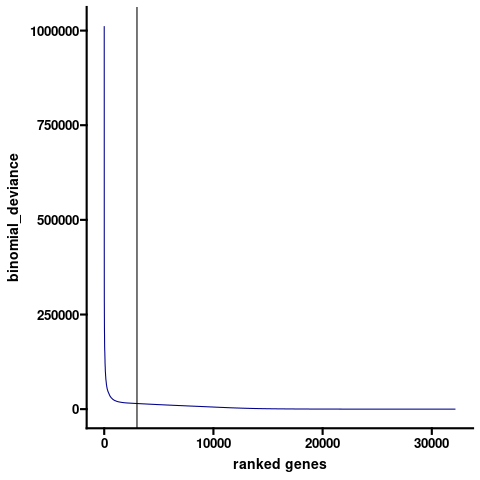

In [32]:
%%R
#Plot to see how many genes show informative deviance
ggplot(as.data.frame(rowData(sce)), aes(x=as.numeric(1:nrow(rowData(sce))), y=binomial_deviance))+
  geom_line(color="darkblue") + xlab("ranked genes") + ggprism::theme_prism() + geom_vline(xintercept=3000)

In [33]:
binomial_deviance = ro.r("rowData(sce)$binomial_deviance").T

In [34]:
idx = binomial_deviance.argsort()[-2000:]
mask = np.zeros(adata.var_names.shape, dtype=bool)
mask[idx] = True

adata.var["highly_deviant"] = mask
adata.var["binomial_deviance"] = binomial_deviance

In [35]:
adata.layers["counts"] = adata.X.copy() # preserve counts
sc.pp.normalize_total(adata, target_sum=1e4) # scale each cell to a common library size
sc.pp.log1p(adata) # log(expression + 1)
sc.pp.highly_variable_genes(adata)

In [36]:
adata

AnnData object with n_obs × n_vars = 12562 × 32165
    obs: 'ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

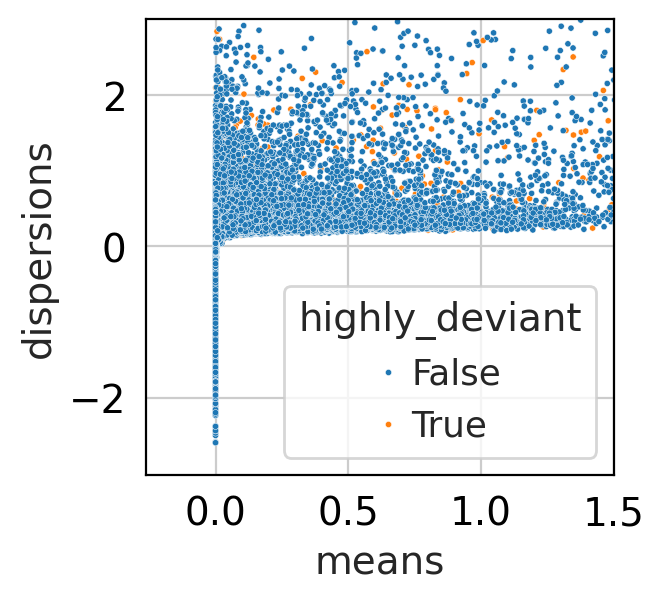

In [37]:
ax = sns.scatterplot(
    data=adata.var, x="means", y="dispersions", hue="highly_deviant", s=5
)
ax.set_xlim(None, 1.5)
ax.set_ylim(None, 3)
plt.show()

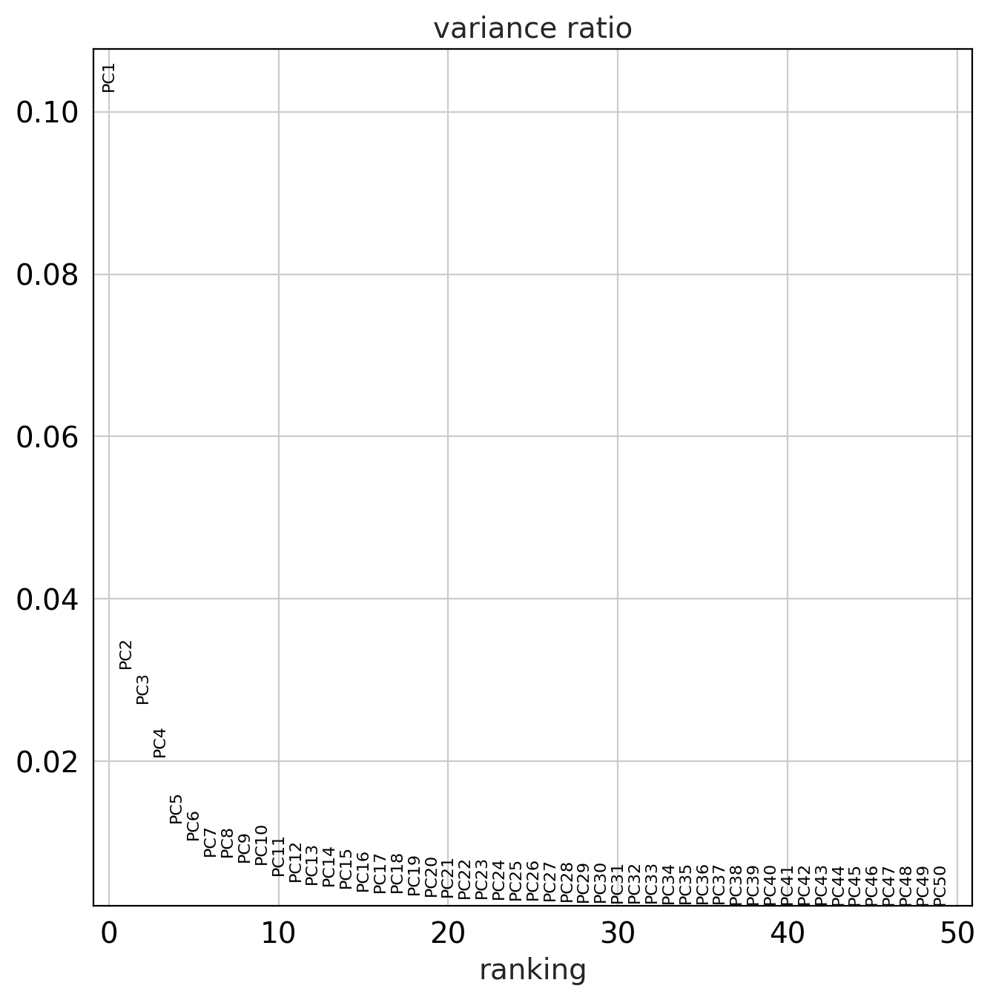

In [38]:
adata.var["highly_variable"] = adata.var["highly_deviant"]
sc.tl.pca(adata, svd_solver="arpack", use_highly_variable=True)

with plt.rc_context():  # Use this to set figure params like size and dpi  
    plt.rcParams['figure.figsize'] = 7.5, 7.5
    sc.pl.pca_variance_ratio(adata, n_pcs=50)

### Cluster
Lets use a function to cluster, then subcluster, these cells. It will cluster at a number of resolutions, then pick the resolution with the highest silhouette score (most distinct clusters).

In [39]:
from sklearn.metrics import silhouette_score
import scanpy as sc
import numpy as np
from scipy.spatial.distance import pdist,squareform

def iterClus(adata, resRange=np.linspace(0.15,1, 9), depthLimit=2, depth=1, pcVarThresh=0.6,kNum=20):
    if depth <= depthLimit:
        
        #Recalculate variable genes and pca for subclusters
        if depth > 1:
            adata = adata.copy()
            adata.var.highly_variable = sc.pp.highly_variable_genes(adata, inplace=False)["highly_variable"].values
            adata = adata[:, adata.var.highly_variable]
            adata = sc.tl.pca(adata, svd_solver='arpack', copy=True)
            pcVar = [np.std(adata.obsm["X_pca"][:, pc]) for pc in range(adata.obsm["X_pca"].shape[1])]
            pcNum = [i for i, v in enumerate(np.cumsum(pcVar) / sum(pcVar)) if v > pcVarThresh][0]
            adata = sc.pp.neighbors(adata, n_pcs=pcNum, copy=True, n_neighbors=kNum)
            
        else: 
            pcNum = adata.uns["neighbors"]["params"]['n_pcs']

        # Cluster at different resolutions
        clusterings = {res: sc.tl.leiden(adata, key_added="leiden", resolution=res, copy=True).obs["leiden"] for res in resRange}
        
        # Find score with highest silhouette scores based on distance matrix computed on PCA matrix
        clusterScores = {res: silhouette_score(adata.obsp["distances"], clusterings[res], metric = "precomputed") if len(clusterings[res].unique()) > 1 else 0.2 for res in clusterings.keys()}
        
        # Return clusterings at highest silhouette score
        adata.obs["iterativeLeiden"] = clusterings[max(clusterScores, key=clusterScores.get)]

        #Iteratively subcluster to depthLimit
        if depth < depthLimit:
            subcluster = {clus: iterClus(adata[adata.obs["iterativeLeiden"] == clus], resRange, depthLimit,
                                              depth=(depth + 1))
                          for clus in adata.obs["iterativeLeiden"].unique()}
        
            #Name cluster by parent and child clusters
            adata.obs["iterativeLeiden"] = ["_".join([adata.obs.loc[cell, "iterativeLeiden"], subcluster[adata.obs.loc[cell, "iterativeLeiden"]][cell]]) for cell in adata.obs.index]
        
        if depth == 1:
            return adata.obs["iterativeLeiden"].astype("category").cat.as_ordered()
        else:
            return adata.obs["iterativeLeiden"]
    else:
        return adata.obs["iterativeLeiden"]

In [40]:
sc.pp.neighbors(adata, n_pcs=10, n_neighbors=20)
sc.tl.umap(adata)

In [41]:
adata.obs["iterativeLeiden"] = iterClus(adata)
adata.obs["parentLeiden"] = adata.obs["iterativeLeiden"].str.rsplit('_', n=1).str.get(0)

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


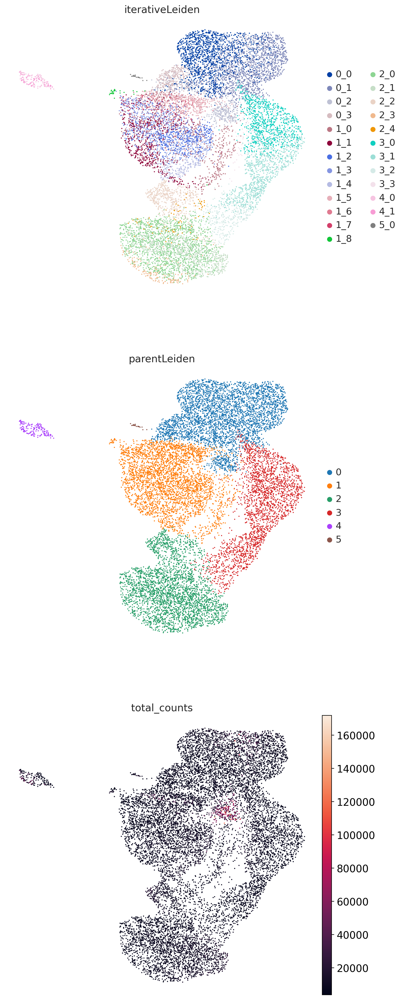

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


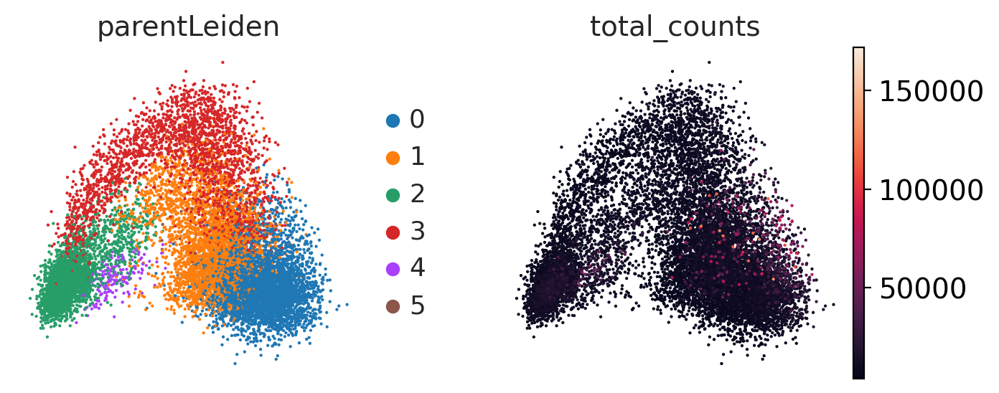

In [42]:
# Visualize
with plt.rc_context():  # Use this to set figure params like size and dpi  
    plt.rcParams['figure.figsize'] = 7.5, 7.5
    sc.pl.umap(adata, color=["iterativeLeiden", "parentLeiden", "total_counts"], ncols = 1)
    
sc.pl.pca_scatter(adata, color=["parentLeiden", "total_counts"])

Let's plot some cerebellar marker genes in these clusters

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


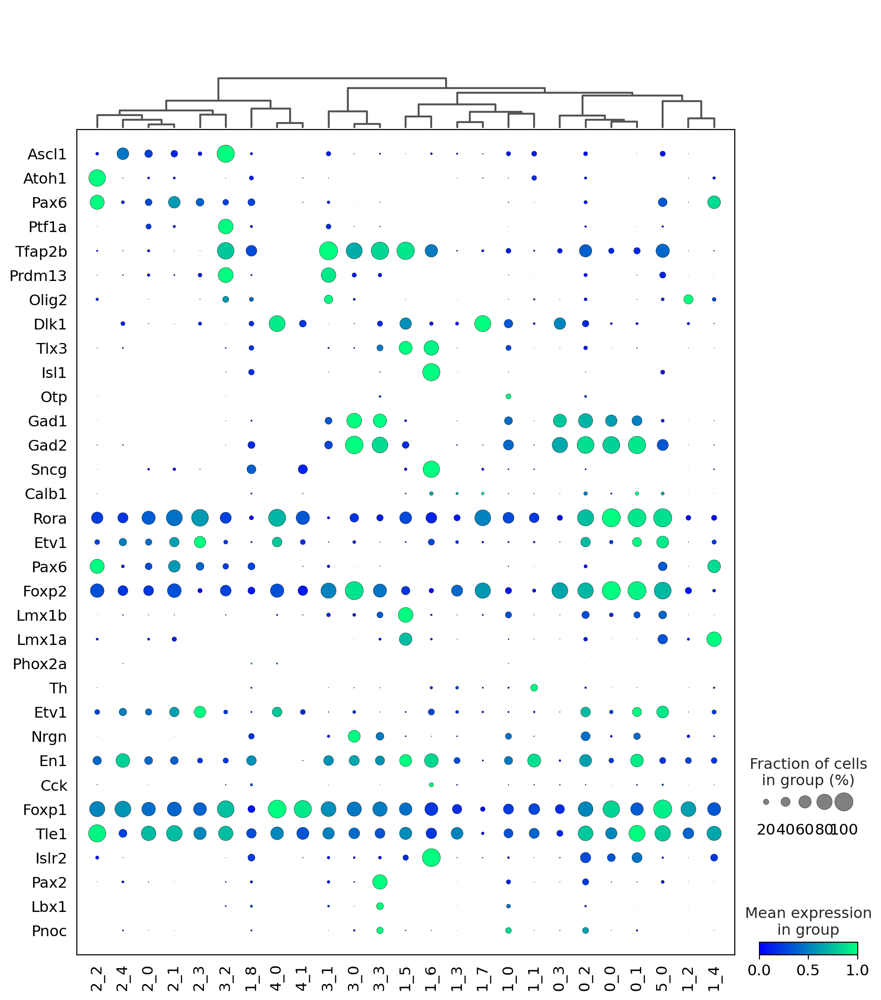

In [44]:
sc.tl.dendrogram(adata, "iterativeLeiden")
sc.pl.DotPlot(adata, ["Ascl1","Atoh1","Pax6", "Ptf1a","Tfap2b", "Prdm13", "Olig2","Dlk1", "Tlx3","Isl1", "Otp", "Gad1", "Gad2", "Sncg", "Calb1", "Rora", "Etv1", "Pax6","Foxp2", "Lmx1b","Lmx1a","Phox2a","Th","Etv1", "Nrgn", "En1", "Cck", "Foxp1", "Tle1", "Islr2", "Pax2","Lbx1",  "Pnoc"], groupby="iterativeLeiden", log=True, standard_scale="var").swap_axes().add_dendrogram().show()

## Now lets annotate these clusters

Load marker genes from Carter et al., 2018 https://www.nature.com/articles/s41586-019-1158-7

In [45]:
# Initialise data to lists.
celltypeMarkers = ['Sparc', 'Nes', 'Id1', 'Id3', 'Hes5', 'Msx2', 'Msx1', 'Sparc', 'Nes', 'Id1', 'Id3', 'Hes5', 'Msx2', 'Msx1', 'Pax6', 'Tmem163', 'Meis2', 'Lhx2', 'Lhx9', 'Grem2', 'Gng8', 'Evx1', 'Selm', 'Pax6', 'Mfap4', 'Neurod1', 'Atoh1', 'Barhl1', 'Ppp2r2c', 'Tlx3', 'Lhx5', 'Lhx1', 'Gad1','Gad2', 'Foxp2', 'Slc32a1', 'Car8', 'Calb1', 'Pcp2', 'Rora', 'Pax2', 'Lbx1', 'Optc',"Pnoc", "Glra2", "Gad1", 'Aldhl1l1', 'Aldoc', 'Hopx', 'Timp4', 'Ndrg2', 'Gdf10', 'Sox9', 'Slc1a3', 'Sparcl1', 'Vtn', 'Bgn','Dcn', 'Slc6a13',  'Hba-a2', 'Alas2', 'Hbb-bt', 'Cldn5', 'Vamp5', 'Pecam1','Dynlrb2','Meig1',  'Tmem119', 'Cx3cr1', 'P2ry12', 'Isl1', 'Sncg', 'Dlk1', 'Krt18', 'Colec12', 'Col3a1', 'Col1a2', 'Rspo1', 'Bambi']
carterMarkers = pd.DataFrame( {
    'gene_symbol':  celltypeMarkers,
    'Annotations': list(np.repeat(["Progenitors", "Glial Progenitors", "Glutamatergic CN", "Granule Neurons + Precursors", "Gabaergic Progenitors", "Purkinje Cells", "Pax2+ve Interneurons", "Astrocytes", "Meninges","Erythrocytes", "Endothelial Cells", "Cillated Cells","Microglia", "Midbrain Cells", 'Roof Plate'], [7,8,7,8,6,4,6,9,4,3,3,2,3,3,6]))
})
carterMarkers

,gene_symbol,Annotations
0,Sparc,Progenitors
1,Nes,Progenitors
2,Id1,Progenitors
3,Id3,Progenitors
4,Hes5,Progenitors
...,...,...
74,Colec12,Roof Plate
75,Col3a1,Roof Plate
76,Col1a2,Roof Plate
77,Rspo1,Roof Plate


Annotate our cells with these marker genes, using with decoupler.

In [46]:
dc.run_ora(
    mat=adata,
    net=carterMarkers,
    source='Annotations',
    target='gene_symbol',
    min_n=3,
    verbose=True,
    use_raw=False
)

6406 features of mat are empty, they will be removed.
Running ora on mat with 12562 samples and 25759 targets for 14 sources.


100%|██████████| 12562/12562 [01:32<00:00, 136.17it/s]


In [47]:
adata.obsm['ora_estimate']

source,Astrocytes,Endothelial Cells,Erythrocytes,Gabaergic Progenitors,Glial Progenitors,Glutamatergic CN,Granule Neurons + Precursors,Meninges,Microglia,Midbrain Cells,Pax2+ve Interneurons,Progenitors,Purkinje Cells,Roof Plate
GCTGCAGGTTCTAAGC,-0.000000,-0.0,-0.0,3.636014,-0.000000,0.428851,-0.000000,-0.0,-0.0,-0.0,-0.000000,-0.000000,0.631187,-0.0
CTCAAGACATTCCTAT,-0.000000,-0.0,-0.0,2.337394,0.384109,0.428851,-0.000000,-0.0,-0.0,-0.0,-0.000000,0.428851,0.631187,-0.0
GCAGCTGTCACCATCC,-0.000000,-0.0,-0.0,2.337394,-0.000000,2.115586,-0.000000,-0.0,-0.0,-0.0,-0.000000,-0.000000,0.631187,-0.0
CGAGTGCAGTGGTCAG,-0.000000,-0.0,-0.0,3.636014,-0.000000,0.428851,-0.000000,-0.0,-0.0,-0.0,-0.000000,-0.000000,0.631187,-0.0
ATTGTTCTCACGATAC,-0.000000,-0.0,-0.0,3.636014,1.932619,0.428851,-0.000000,-0.0,-0.0,-0.0,-0.000000,2.115586,0.631187,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTTGTGATCATTGTTC,-0.000000,-0.0,-0.0,2.337394,-0.000000,-0.000000,-0.000000,-0.0,-0.0,-0.0,-0.000000,-0.000000,0.631187,-0.0
TGTCCCAGTGCGTCGT,1.047922,-0.0,-0.0,-0.000000,3.012551,-0.000000,-0.000000,-0.0,-0.0,-0.0,-0.000000,3.290836,-0.000000,-0.0
CGTGATACAAGCCATT,-0.000000,-0.0,-0.0,3.636014,-0.000000,-0.000000,-0.000000,-0.0,-0.0,-0.0,-0.000000,-0.000000,0.631187,-0.0
AAAGTCCAGGTAAGAG,-0.000000,-0.0,-0.0,0.482389,-0.000000,-0.000000,2.115586,-0.0,-0.0,-0.0,-0.000000,-0.000000,0.631187,-0.0


Annotate our clusters by top predicted annotation

In [48]:
acts = dc.get_acts(adata, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed for pvals=0
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

CarterPreds = dc.rank_sources_groups(acts, groupby='iterativeLeiden', reference='rest', method='t-test_overestim_var')

Get top 3 annotations per cluster

In [49]:
n_ctypes = 3
ctypes_dict = CarterPreds.groupby('group').head(n_ctypes).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
ctypes_dict

{'0_0': ['Purkinje Cells', 'Gabaergic Progenitors', 'Pax2+ve Interneurons'],
 '0_1': ['Purkinje Cells', 'Gabaergic Progenitors', 'Pax2+ve Interneurons'],
 '0_2': ['Gabaergic Progenitors', 'Purkinje Cells', 'Pax2+ve Interneurons'],
 '0_3': ['Gabaergic Progenitors', 'Midbrain Cells', 'Pax2+ve Interneurons'],
 '1_0': ['Pax2+ve Interneurons', 'Midbrain Cells', 'Glutamatergic CN'],
 '1_1': ['Glutamatergic CN', 'Microglia', 'Erythrocytes'],
 '1_2': ['Glutamatergic CN', 'Granule Neurons + Precursors', 'Erythrocytes'],
 '1_3': ['Glutamatergic CN', 'Pax2+ve Interneurons', 'Erythrocytes'],
 '1_4': ['Granule Neurons + Precursors', 'Glutamatergic CN', 'Erythrocytes'],
 '1_5': ['Midbrain Cells', 'Erythrocytes', 'Microglia'],
 '1_6': ['Midbrain Cells', 'Glutamatergic CN', 'Erythrocytes'],
 '1_7': ['Midbrain Cells', 'Glutamatergic CN', 'Purkinje Cells'],
 '1_8': ['Midbrain Cells', 'Glutamatergic CN', 'Granule Neurons + Precursors'],
 '2_0': ['Progenitors', 'Glial Progenitors', 'Astrocytes'],
 '2_1': 

Visualise cluster -> annotation links

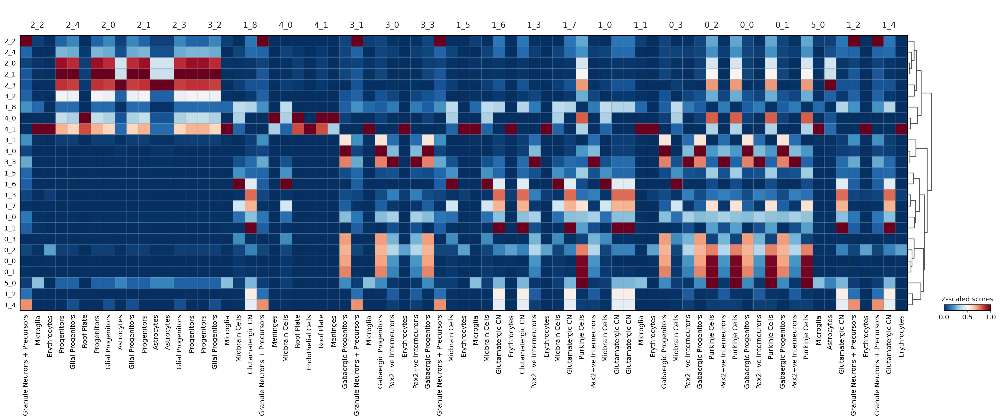

In [50]:
sc.pl.matrixplot(acts, ctypes_dict, 'iterativeLeiden', dendrogram=True, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='RdBu_r')


Download markers from another atlas: Wizeman et al., 2018

In [51]:
!wget https://elifesciences.org/download/aHR0cHM6Ly9jZG4uZWxpZmVzY2llbmNlcy5vcmcvYXJ0aWNsZXMvNDIzODgvZWxpZmUtNDIzODgtc3VwcDEtdjIueGxzeA--/elife-42388-supp1-v2.xlsx?_hash=THk9BqxTt1fTNHj%2BBWcJgek65IHkjA1AfblOYrc0Ugc%3D -O Wizeman2018CerebellumMarkers.xlsx

--2024-01-17 10:37:26--  https://elifesciences.org/download/aHR0cHM6Ly9jZG4uZWxpZmVzY2llbmNlcy5vcmcvYXJ0aWNsZXMvNDIzODgvZWxpZmUtNDIzODgtc3VwcDEtdjIueGxzeA--/elife-42388-supp1-v2.xlsx?_hash=THk9BqxTt1fTNHj%2BBWcJgek65IHkjA1AfblOYrc0Ugc%3D
Resolving elifesciences.org (elifesciences.org)... 151.101.130.217, 151.101.194.217, 151.101.66.217, ...
Connecting to elifesciences.org (elifesciences.org)|151.101.130.217|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1338207 (1.3M) [application/vnd.openxmlformats-officedocument.spreadsheetml.sheet]
Saving to: ‘../../resources/markerGenes/Wizeman2018CerebellumMarkers.xlsx’

../../resources/mar 100%[===================>]   1.28M  3.92MB/s    in 0.3s    

2024-01-17 10:37:27 (3.92 MB/s) - ‘../../resources/markerGenes/Wizeman2018CerebellumMarkers.xlsx’ saved [1338207/1338207]



Make into dataframe

In [52]:
wizemanMarkers = pd.read_excel("Wizeman2018CerebellumMarkers.xlsx", sheet_name="Table 1a_AllCells")
wizemanMarkers.cellType.unique()

array(['Pericyte', 'Endothelium', 'GABA.Pro', 'Ptf1a+', 'RL (EGL)',
       'Atoh1+', 'NPC', 'C1', 'PTZ', 'MidO', 'BG-like', 'Erythrocyte',
       'BloodCell', 'GC', 'lCN + IsN', 'DNCl', 'medial CN', 'DNCm',
       'Foxp1+', 'PC.Foxp1+', 'PC.Etv1+', 'Etv1+', 'En1+', 'PC.En1+',
       'Snca+', 'PC.Calb1+', 'Tfap2b+', 'GABA.Pre', 'Nrgn+', 'PC.Nrgn+',
       'IN'], dtype=object)

In [53]:
wizemanMarkers = wizemanMarkers[(wizemanMarkers["avg_diff"] > 0.75) & (wizemanMarkers["pct.1"] > 0.3) & (wizemanMarkers["pct.diff"] > 0.2)]
wizemanMarkers = wizemanMarkers[["gene", "cellType"]]
wizemanMarkers.cellType.value_counts()

cellType
Endothelium    319
Pericyte       173
MidO           118
BG-like        104
NPC             70
C1              39
Atoh1+          30
Ptf1a+          27
GC              22
IN              18
DNCm            17
Tfap2b+         17
Foxp1+          13
Erythrocyte     11
Snca+           11
RL (EGL)        10
medial CN       10
GABA.Pre         8
GABA.Pro         8
Etv1+            7
lCN + IsN        6
BloodCell        6
En1+             6
Nrgn+            6
PC.Foxp1+        4
DNCl             3
PC.Calb1+        3
PC.Nrgn+         1
PC.Etv1+         1
Name: count, dtype: int64

Annotate with decoupler, using these marker genes

In [54]:
dc.run_ora(
    mat=adata,
    net=wizemanMarkers,
    source='cellType',
    target='gene',
    min_n=3,
    verbose=True,
    use_raw=False
)

6406 features of mat are empty, they will be removed.
Running ora on mat with 12562 samples and 25759 targets for 27 sources.


100%|██████████| 12562/12562 [00:34<00:00, 359.29it/s]


In [55]:
acts = dc.get_acts(adata, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed for pvals=0
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

WizemanPreds = dc.rank_sources_groups(acts, groupby='iterativeLeiden', reference='rest', method='t-test_overestim_var')

Calculate cluster marker genes unbiasedly 

In [56]:
sc.tl.rank_genes_groups(
    adata, groupby="iterativeLeiden", method="wilcoxon", key_added="dea_leiden"
)

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/andy/bioinformatics/projects/DaniSC/c

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


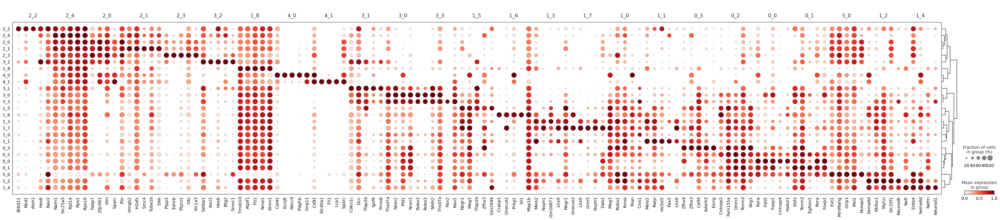

In [57]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="iterativeLeiden", standard_scale="var", n_genes=5, key="dea_leiden"
)

In [58]:
adata.obs.groupby(["iterativeLeiden"], as_index=False)['total_counts'].median()

,iterativeLeiden,total_counts
0,0_0,8113.0
1,0_1,8482.0
2,0_2,16197.0
3,0_3,7540.0
4,1_0,8559.0
5,1_1,7968.5
6,1_2,9375.0
7,1_3,8020.0
8,1_4,11798.0
9,1_5,8379.0


Plot some marker genes

In [59]:
carterMarkers.loc[len(carterMarkers)] = ["Otp", "Otp"]
carterMarkers.loc[len(carterMarkers)] = ["Isl1", "Mesencephalon"]
carterMarkers.loc[len(carterMarkers)] = ["Dlk1", "Mesencephalon"]
carterMarkers.loc[len(carterMarkers)] = ["C1qa", "Microglia"]
carterMarkers.loc[len(carterMarkers)] = ["C1qb", "Microglia"]
carterMarkers.loc[len(carterMarkers)] = ["Trem2", "Microglia"]

In [60]:
carterMarkers.Annotations = carterMarkers.Annotations.astype("category").cat.set_categories(["Progenitors", "Glial Progenitors", "Astrocytes", "Gabaergic Progenitors", "Pax2+ve Interneurons", "Purkinje Cells","Otp", "Glutamatergic CN", "Granule Neurons + Precursors","Mesencephalon", "Midbrain Cells","Microglia", "Endothelial Cells"])

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


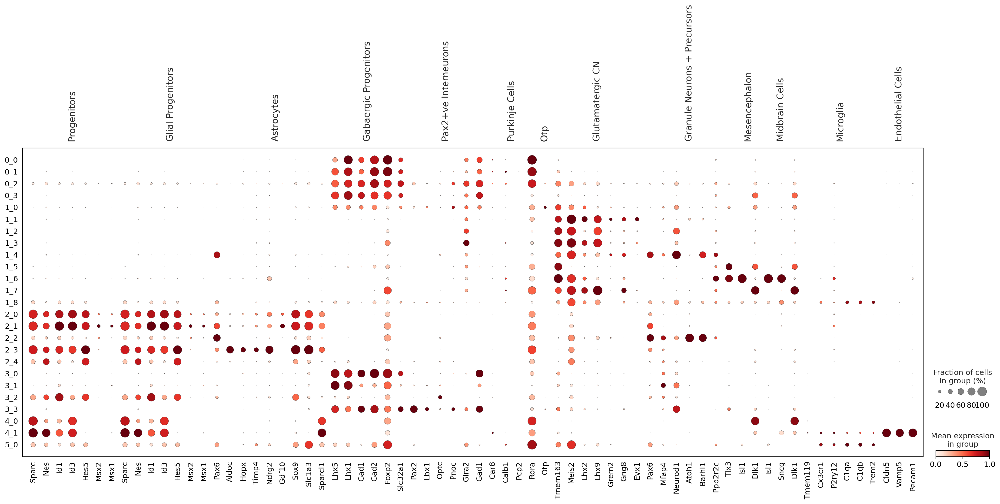

In [61]:
markersDict = {k: [gene for gene in g["gene_symbol"].tolist() if gene in adata.var_names] for k,g in carterMarkers.groupby("Annotations")} 
sc.tl.dendrogram(adata, "iterativeLeiden")
sc.pl.dotplot(adata, markersDict, groupby="iterativeLeiden", log=True, standard_scale="var", dendrogram=False)

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


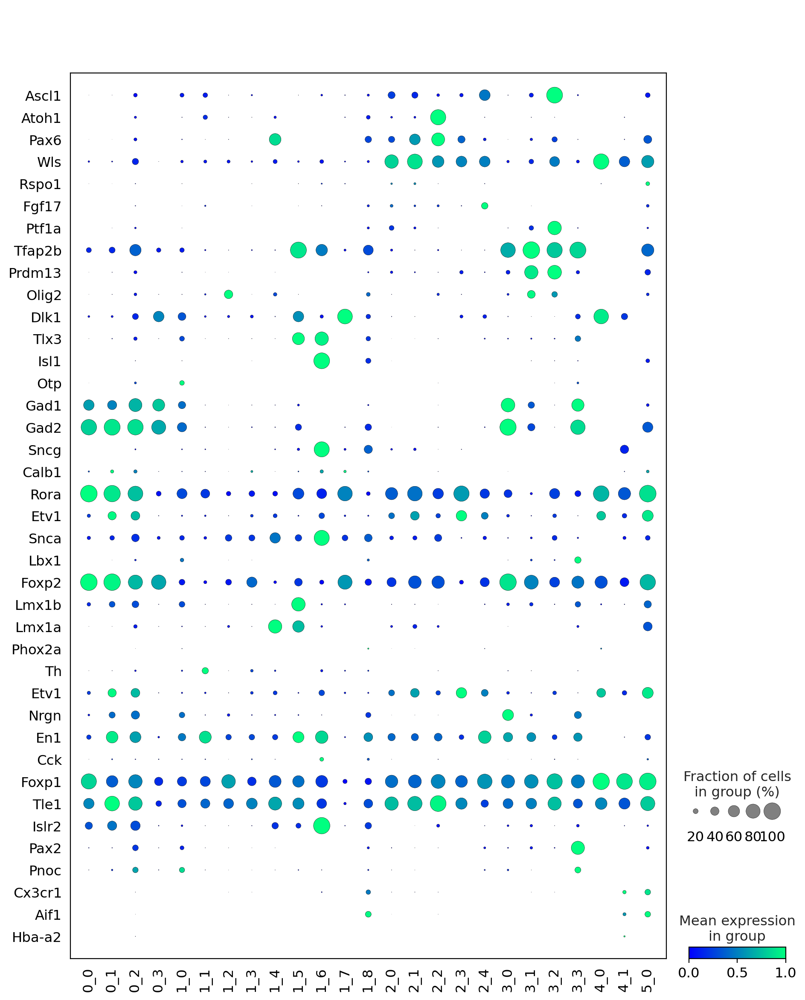

In [62]:
sc.pl.DotPlot(adata, ["Ascl1","Atoh1", "Pax6","Wls", "Rspo1", "Fgf17", "Ptf1a","Tfap2b", "Prdm13", "Olig2","Dlk1", "Tlx3","Isl1", "Otp", "Gad1", "Gad2", "Sncg", "Calb1", "Rora", "Etv1","Snca", "Lbx1", "Foxp2", "Lmx1b","Lmx1a","Phox2a","Th", "Etv1", "Nrgn", "En1", "Cck", "Foxp1", "Tle1", "Islr2", "Pax2", "Pnoc", "Cx3cr1", "Aif1", "Hba-a2"], groupby="iterativeLeiden", log=True, standard_scale="var").swap_axes().show()

### Compare Annotations using two marker sets

In [63]:
annotationDictCarter = CarterPreds.groupby('group').head(1).set_index('group')['names'].to_dict()
annotationDictCarter

{'0_0': 'Purkinje Cells',
 '0_1': 'Purkinje Cells',
 '0_2': 'Gabaergic Progenitors',
 '0_3': 'Gabaergic Progenitors',
 '1_0': 'Pax2+ve Interneurons',
 '1_1': 'Glutamatergic CN',
 '1_2': 'Glutamatergic CN',
 '1_3': 'Glutamatergic CN',
 '1_4': 'Granule Neurons + Precursors',
 '1_5': 'Midbrain Cells',
 '1_6': 'Midbrain Cells',
 '1_7': 'Midbrain Cells',
 '1_8': 'Midbrain Cells',
 '2_0': 'Progenitors',
 '2_1': 'Glial Progenitors',
 '2_2': 'Granule Neurons + Precursors',
 '2_3': 'Astrocytes',
 '2_4': 'Progenitors',
 '3_0': 'Gabaergic Progenitors',
 '3_1': 'Gabaergic Progenitors',
 '3_2': 'Progenitors',
 '3_3': 'Pax2+ve Interneurons',
 '4_0': 'Meninges',
 '4_1': 'Endothelial Cells',
 '5_0': 'Purkinje Cells'}

In [64]:
annotationDictWizeman = WizemanPreds.groupby('group').head(1).set_index('group')['names'].to_dict()
annotationDictWizeman

{'0_0': 'Foxp1+',
 '0_1': 'En1+',
 '0_2': 'Etv1+',
 '0_3': 'PC.Calb1+',
 '1_0': 'DNCl',
 '1_1': 'lCN + IsN',
 '1_2': 'DNCl',
 '1_3': 'lCN + IsN',
 '1_4': 'DNCm',
 '1_5': 'Etv1+',
 '1_6': 'BloodCell',
 '1_7': 'lCN + IsN',
 '1_8': 'lCN + IsN',
 '2_0': 'NPC',
 '2_1': 'C1',
 '2_2': 'RL (EGL)',
 '2_3': 'BG-like',
 '2_4': 'Atoh1+',
 '3_0': 'Nrgn+',
 '3_1': 'Tfap2b+',
 '3_2': 'Ptf1a+',
 '3_3': 'IN',
 '4_0': 'Pericyte',
 '4_1': 'Endothelium',
 '5_0': 'Erythrocyte'}

Now lets just modify the Wizeman predictions, based on annotations from Carters and the known marker genes and those we found using differential expression, that we have plotted   

In [65]:
annotationDictWizeman["0_3"] = "Mes Dlk1+" #Wizeman et al., 2019
annotationDictWizeman["1_0"] = "Otp+ Prog" 
annotationDictWizeman["1_5"] = "Lmx1b+ Tlx3+"
annotationDictWizeman["1_6"] = "Mes Isl1+ Tlx3+" #Wizeman et al., 2019
annotationDictWizeman["1_7"] = "Mes"
annotationDictWizeman["1_8"] = "Doublet"  
annotationDictWizeman["2_4"] = "MidO"  
annotationDictWizeman["5_0"] = "Microglia"  

annotationDictWizeman

{'0_0': 'Foxp1+',
 '0_1': 'En1+',
 '0_2': 'Etv1+',
 '0_3': 'Mes Dlk1+',
 '1_0': 'Otp+ Prog',
 '1_1': 'lCN + IsN',
 '1_2': 'DNCl',
 '1_3': 'lCN + IsN',
 '1_4': 'DNCm',
 '1_5': 'Lmx1b+ Tlx3+',
 '1_6': 'Mes Isl1+ Tlx3+',
 '1_7': 'Mes',
 '1_8': 'Doublet',
 '2_0': 'NPC',
 '2_1': 'C1',
 '2_2': 'RL (EGL)',
 '2_3': 'BG-like',
 '2_4': 'MidO',
 '3_0': 'Nrgn+',
 '3_1': 'Tfap2b+',
 '3_2': 'Ptf1a+',
 '3_3': 'IN',
 '4_0': 'Pericyte',
 '4_1': 'Endothelium',
 '5_0': 'Microglia'}

Add cell type column to sc object based on annotation

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


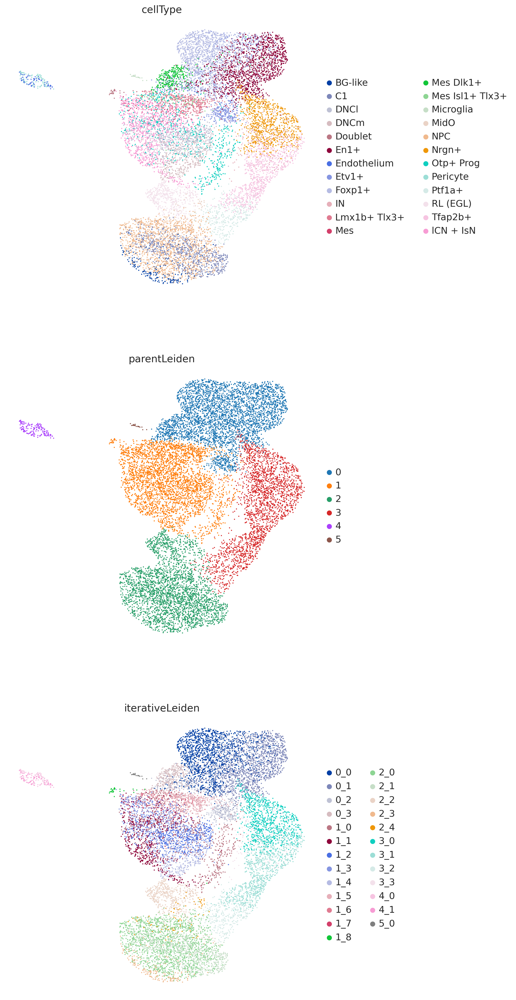

In [66]:
adata.obs['cellType'] = [annotationDictWizeman[clust] for clust in adata.obs['iterativeLeiden']]

# Visualize
with plt.rc_context():  # Use this to set figure params like size and dpi  
    plt.rcParams['figure.figsize'] = 7.5, 7.5
    sc.pl.umap(adata, color=['cellType', 'parentLeiden', "iterativeLeiden"], ncols = 1)

### Now let's refine these annotations using subcluster markers from Wizeman et al., 2019

For NPCs

In [67]:
markers = pd.read_excel("Wizeman2018CerebellumMarkers.xlsx", sheet_name="Table 1b_NPC")
markers.cellType.unique()

array(['MidO', 'Anterior VZ', 'Posterior VZ', 'PTZ'], dtype=object)

In [68]:
markers = markers[(markers["avg_diff"] > 0.5) & (markers["pct.1"] > 0.25) & (markers["pct.diff"] > 0.2)]
markers = markers[["gene", "cellType"]]
markers.cellType.value_counts()

cellType
MidO            112
Anterior VZ      47
PTZ              26
Posterior VZ      3
Name: count, dtype: int64

In [69]:
adataNPC = adata[adata.obs["cellType"].isin(["NPC", "MidO", "C1"])].copy()
dc.run_ora(
    mat=adataNPC,
    net=markers,
    source='cellType',
    target='gene',
    min_n=3,
    verbose=True,
    use_raw=False
)

10166 features of mat are empty, they will be removed.
Running ora on mat with 2337 samples and 21999 targets for 4 sources.


100%|██████████| 2337/2337 [02:29<00:00, 15.63it/s]


In [70]:
acts = dc.get_acts(adataNPC, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed for pvals=0
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

npcPreds = dc.rank_sources_groups(acts, groupby='iterativeLeiden', reference='rest', method='t-test_overestim_var')

In [71]:
npcPreds = npcPreds.groupby('group').head(1).set_index('group')['names'].to_dict()
npcPreds

{'2_0': 'Anterior VZ', '2_1': 'PTZ', '2_4': 'MidO'}

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


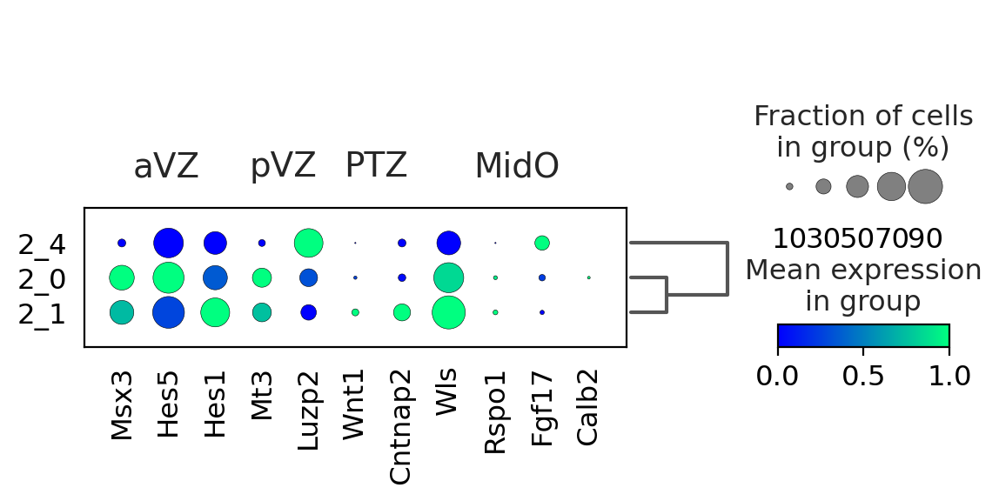

In [72]:
npcMarkers = {"aVZ": ["Msx3", "Hes5", "Hes1"],
               "pVZ": ["Mt3", "Luzp2"],
               "PTZ": ["Wnt1", "Cntnap2"],
               "MidO": ["Wls", "Rspo1", "Fgf17", "Calb2"]
}
sc.tl.dendrogram(adataNPC, "iterativeLeiden")
sc.pl.DotPlot(adataNPC,
              npcMarkers,
              groupby="iterativeLeiden", log=True, standard_scale="var").add_dendrogram().show()

Alter some assignments

In [73]:
npcPreds['2_0'] = 'VZ'
npcPreds

{'2_0': 'VZ', '2_1': 'PTZ', '2_4': 'MidO'}

In [74]:
adata.obs['refinedCelltypes'] = [npcPreds[clust] if clust in npcPreds.keys() else annotationDictWizeman[clust] for clust in adata.obs['iterativeLeiden']]
adata.obs['refinedCelltypes'].value_counts()

refinedCelltypes
VZ                 1437
Foxp1+             1407
En1+               1407
lCN + IsN          1085
Nrgn+               870
Tfap2b+             866
PTZ                 806
Otp+ Prog           664
Etv1+               631
DNCl                552
RL (EGL)            463
DNCm                430
Lmx1b+ Tlx3+        421
Ptf1a+              348
Mes Dlk1+           331
IN                  203
BG-like             185
MidO                 94
Mes Isl1+ Tlx3+      92
Pericyte             88
Endothelium          72
Mes                  61
Doublet              28
Microglia            21
Name: count, dtype: int64

For GABAergic

In [75]:
markers = pd.read_excel("Wizeman2018CerebellumMarkers.xlsx", sheet_name="Table 1c_GABAergic")
markers.cellType.unique()

array(['GABA.pre', 'GABA.IN', 'PC4.Foxp1', 'PC5.Cck', 'PC1.Etv1',
       'PC3.En1', 'PC2.Nrgn', 'GABA.p2'], dtype=object)

In [76]:
markers = markers[(markers["avg_logFC"] > 0.5) & (markers["pct.1"] > 0.25) & (markers["pct.diff"] > 0.2)]
markers = markers[["gene", "cellType"]]
markers = markers.drop_duplicates()
markers.cellType.value_counts()

cellType
GABA.p2      155
GABA.pre      40
GABA.IN       26
PC4.Foxp1     19
PC5.Cck       18
PC1.Etv1      11
PC2.Nrgn       7
PC3.En1        5
Name: count, dtype: int64

In [77]:
adataGABA = adata[adata.obs["cellType"].isin(["Tfap2b+","Ptf1a+","Nrgn+","Foxp1+","En1+","Etv1+", "IN", "Snca+", "PC.Calb1+"])].copy()

dc.run_ora(
    mat=adataGABA,
    net=markers,
    source='cellType',
    target='gene',
    min_n=3,
    verbose=True,
    use_raw=False
)

7991 features of mat are empty, they will be removed.
Running ora on mat with 5732 samples and 24174 targets for 8 sources.


100%|██████████| 5732/5732 [06:01<00:00, 15.88it/s]


In [78]:
acts = dc.get_acts(adataGABA, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed for pvals=0
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

gabaPreds = dc.rank_sources_groups(acts, groupby='iterativeLeiden', reference='rest', method='t-test_overestim_var')

In [79]:
sc.tl.rank_genes_groups(
    adataGABA, groupby="iterativeLeiden", method="wilcoxon", key_added="dea_leiden"
)

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


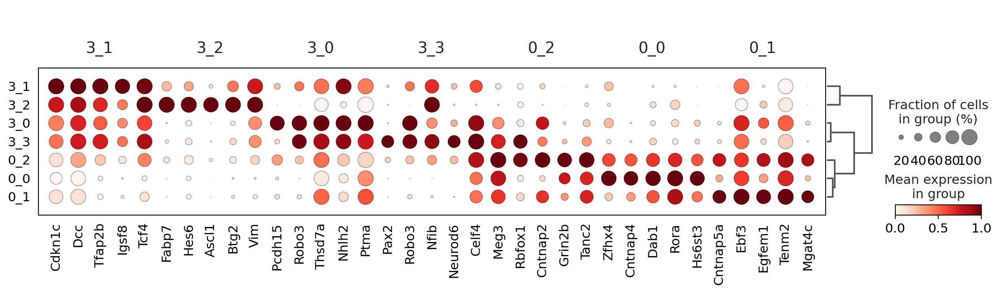

In [80]:
sc.tl.dendrogram(adataGABA, "iterativeLeiden")
sc.pl.rank_genes_groups_dotplot(
    adataGABA, groupby="iterativeLeiden", standard_scale="var", n_genes=5, key="dea_leiden"
)

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


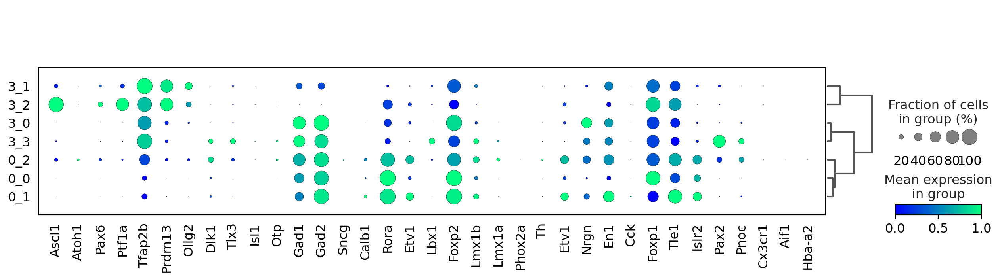

In [81]:
sc.pl.DotPlot(adataGABA, ["Ascl1","Atoh1", "Pax6", "Ptf1a","Tfap2b", "Prdm13", "Olig2","Dlk1", "Tlx3","Isl1", "Otp", "Gad1", "Gad2", "Sncg", "Calb1", "Rora", "Etv1", "Lbx1", "Foxp2", "Lmx1b","Lmx1a","Phox2a","Th", "Etv1", "Nrgn", "En1", "Cck", "Foxp1", "Tle1", "Islr2", "Pax2", "Pnoc", "Cx3cr1", "Aif1", "Hba-a2"], groupby="iterativeLeiden", log=True, standard_scale="var").add_dendrogram().show()

In [82]:
gabaPreds = gabaPreds.groupby('group').head(1).set_index('group')['names'].to_dict()
gabaPreds

{'0_0': 'PC4.Foxp1',
 '0_1': 'PC2.Nrgn',
 '0_2': 'PC1.Etv1',
 '3_0': 'GABA.pre',
 '3_1': 'GABA.pre',
 '3_2': 'GABA.p2',
 '3_3': 'GABA.IN'}

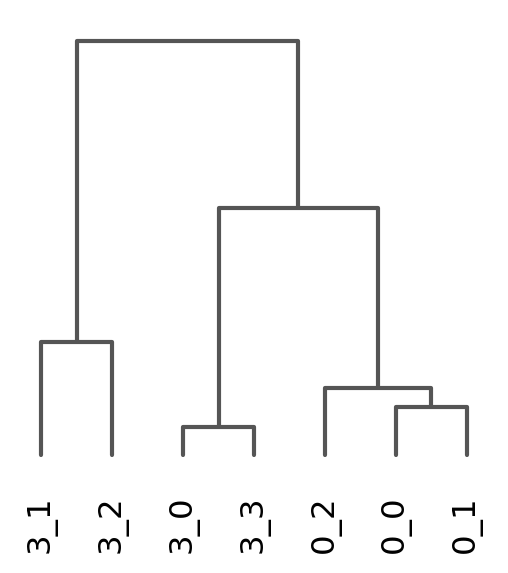

<Axes: >

In [83]:
sc.tl.dendrogram(adataGABA, "iterativeLeiden")
sc.pl.dendrogram(adataGABA, "iterativeLeiden", show=True)

In [84]:
gabaPreds["0_0"] = "PC.Foxp1"
gabaPreds["0_1"] = "PC.Etv1"
gabaPreds["0_2"] = "Doublet"
gabaPreds["3_0"] = "GABA.Pro Ngrn+"
gabaPreds["3_2"] = "GABA.Pro Ptf1a+"
gabaPreds["3_1"] = "GABA.Pro Tfap2b+"
gabaPreds

{'0_0': 'PC.Foxp1',
 '0_1': 'PC.Etv1',
 '0_2': 'Doublet',
 '3_0': 'GABA.Pro Ngrn+',
 '3_1': 'GABA.Pro Tfap2b+',
 '3_2': 'GABA.Pro Ptf1a+',
 '3_3': 'GABA.IN'}

In [85]:
adata.obs['refinedCelltypes'] = [gabaPreds[clust] if clust in gabaPreds.keys() else npcPreds[clust] if clust in npcPreds.keys() else annotationDictWizeman[clust] for clust in adata.obs['iterativeLeiden']]
adata.obs['refinedCelltypes'].value_counts()

refinedCelltypes
VZ                  1437
PC.Foxp1            1407
PC.Etv1             1407
lCN + IsN           1085
GABA.Pro Ngrn+       870
GABA.Pro Tfap2b+     866
PTZ                  806
Otp+ Prog            664
Doublet              659
DNCl                 552
RL (EGL)             463
DNCm                 430
Lmx1b+ Tlx3+         421
GABA.Pro Ptf1a+      348
Mes Dlk1+            331
GABA.IN              203
BG-like              185
MidO                  94
Mes Isl1+ Tlx3+       92
Pericyte              88
Endothelium           72
Mes                   61
Microglia             21
Name: count, dtype: int64

For Glutamatergic

In [86]:
markers = pd.read_excel("Wizeman2018CerebellumMarkers.xlsx", sheet_name="Table 1d_Glutamatergic")
markers.cellType.unique()

array(['C1', 'RL1', 'RL2', 'PC', 'RL3', 'RL4', 'mCN', 'Mes', 'lCN', 'GC',
       'GC1', 'IsN'], dtype=object)

In [87]:
markers = markers[(markers["avg_logFC"] > 0.5) & (markers["pct.1"] > 0.25) & (markers["pct.diff"] > 0.2)]
markers = markers[["gene", "cellType"]]
markers = markers.drop_duplicates()
markers.cellType.value_counts()

cellType
Mes    186
RL4    121
mCN    114
RL3    107
C1      91
GC      65
IsN     47
lCN     43
GC1     28
RL1     23
PC      18
RL2     10
Name: count, dtype: int64

In [88]:
adata.obs["cellType"].value_counts()

cellType
NPC                1437
En1+               1407
Foxp1+             1407
lCN + IsN          1085
Nrgn+               870
Tfap2b+             866
C1                  806
Otp+ Prog           664
Etv1+               631
DNCl                552
RL (EGL)            463
DNCm                430
Lmx1b+ Tlx3+        421
Ptf1a+              348
Mes Dlk1+           331
IN                  203
BG-like             185
MidO                 94
Mes Isl1+ Tlx3+      92
Pericyte             88
Endothelium          72
Mes                  61
Doublet              28
Microglia            21
Name: count, dtype: int64

In [89]:
adataGlut = adata[adata.obs["cellType"].isin(["lCN + IsN","DNCl","GC", "DNCm","medial CN","IsN", "RL (EGL)", "Atoh1+"])].copy()
dc.run_ora(
    mat=adataGlut,
    net=markers,
    source='cellType',
    target='gene',
    min_n=3,
    verbose=True,
    use_raw=False
)

9454 features of mat are empty, they will be removed.
Running ora on mat with 2530 samples and 22711 targets for 12 sources.


100%|██████████| 2530/2530 [00:38<00:00, 66.44it/s] 


In [90]:
acts = dc.get_acts(adataGlut, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed for pvals=0
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

glutPreds = dc.rank_sources_groups(acts, groupby='iterativeLeiden', reference='rest', method='t-test_overestim_var')

In [91]:
glutPreds = glutPreds.groupby('group').head(1).set_index('group')['names'].to_dict()

Check these assignments with some marker genes

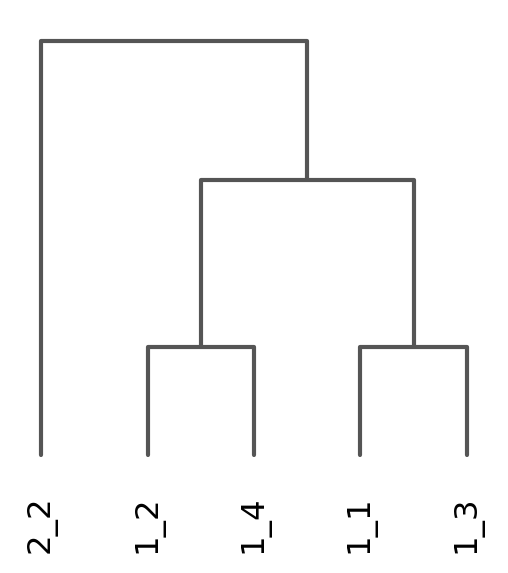

<Axes: >

In [92]:
sc.tl.dendrogram(adataGlut, "iterativeLeiden")
sc.pl.dendrogram(adataGlut, "iterativeLeiden", show=True)

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


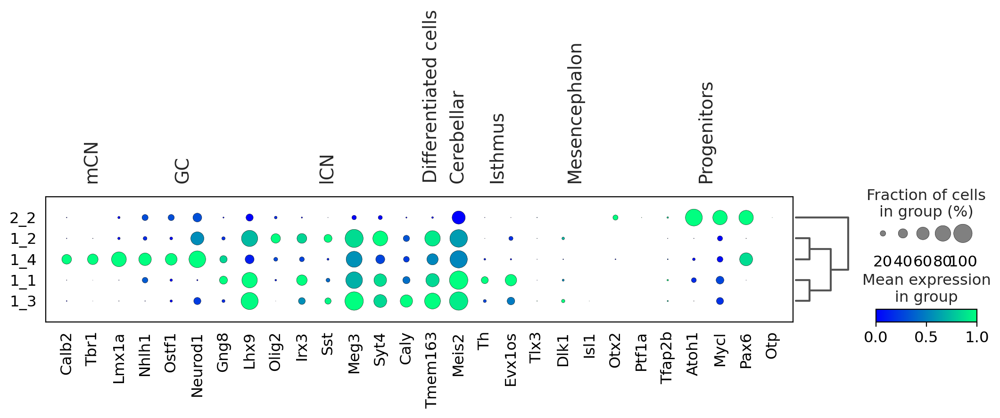

In [93]:
glutMarkers = {"mCN": ["Calb2", "Tbr1", "Lmx1a"],
               "GC": ["Nhlh1", "Ostf1", "Neurod1", "Gng8"],
               "lCN": ["Lhx9", "Olig2","Irx3", "Sst", "Meg3", "Syt4", "Caly"],
               "Differentiated cells": ["Tmem163"],
               "Cerebellar": ["Meis2"],
               "Isthmus": ["Th","Evx1os"],
               "Mesencephalon": ["Tlx3", "Dlk1", "Isl1","Otx2"],
               "Progenitors": ["Ptf1a", "Tfap2b", "Atoh1", "Mycl", "Pax6", "Otp"]
}
sc.pl.DotPlot(adataGlut,
              glutMarkers,
              groupby="iterativeLeiden", log=True, standard_scale="var").add_dendrogram().show()

In [94]:
glutPreds

{'1_1': 'IsN', '1_2': 'lCN', '1_3': 'lCN', '1_4': 'GC', '2_2': 'RL2'}

Change some assignments

In [95]:
glutPreds["2_2"] = "GC+RL"
glutPreds["1_4"] = "mCN"

glutPreds

{'1_1': 'IsN', '1_2': 'lCN', '1_3': 'lCN', '1_4': 'mCN', '2_2': 'GC+RL'}

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


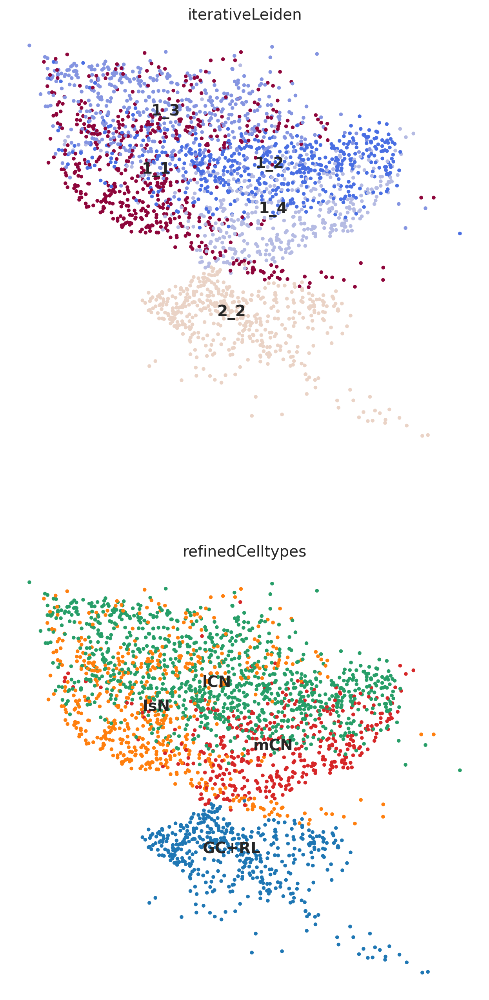

In [96]:
adataGlut.obs["refinedCelltypes"] = [glutPreds[clust] for clust in adataGlut.obs['iterativeLeiden']]
# Visualize
with plt.rc_context():  # Use this to set figure params like size and dpi    
    plt.rcParams['figure.figsize'] = 7.5, 7.5
    sc.pl.umap(adataGlut, color=["iterativeLeiden","refinedCelltypes"], ncols = 1, legend_loc="on data")

In [97]:
adata.obs['refinedCelltypes'] = [glutPreds[clust] if clust in glutPreds.keys() else gabaPreds[clust] if clust in gabaPreds.keys() else npcPreds[clust] if clust in npcPreds.keys() else annotationDictWizeman[clust] for clust in adata.obs['iterativeLeiden']]
adata.obs['refinedCelltypes'] = adata.obs['refinedCelltypes'].replace("Mes", "mCN")
adata.obs['refinedCelltypes'].value_counts()

refinedCelltypes
VZ                  1437
PC.Foxp1            1407
PC.Etv1             1407
lCN                 1069
GABA.Pro Ngrn+       870
GABA.Pro Tfap2b+     866
PTZ                  806
Otp+ Prog            664
Doublet              659
IsN                  568
mCN                  491
GC+RL                463
Lmx1b+ Tlx3+         421
GABA.Pro Ptf1a+      348
Mes Dlk1+            331
GABA.IN              203
BG-like              185
MidO                  94
Mes Isl1+ Tlx3+       92
Pericyte              88
Endothelium           72
Microglia             21
Name: count, dtype: int64

Remove doublet clusters

In [98]:
adata = adata[~adata.obs["refinedCelltypes"].isin(["Doublet"])]

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


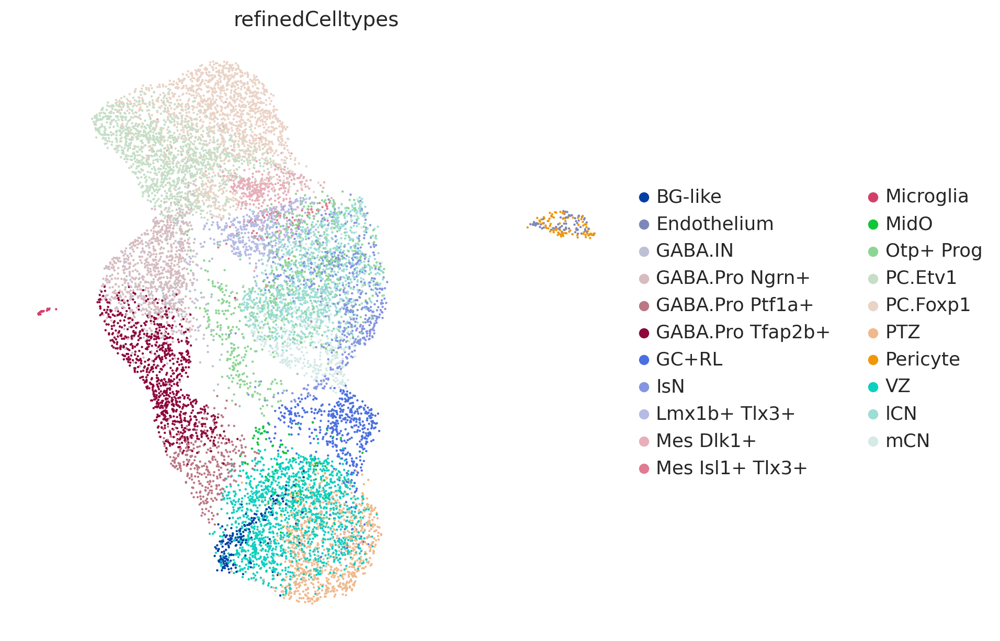

In [99]:
sc.pp.neighbors(adata, n_pcs=10, n_neighbors=20)
sc.tl.umap(adata)

# Visualize
with plt.rc_context():  # Use this to set figure params like size and dpi    
    plt.rcParams['figure.figsize'] = 7.5, 7.5
    sc.pl.umap(adata, color=["refinedCelltypes"], ncols = 1, show=False)
    plt.savefig("analysis/plots/annotation/umap.jpg", bbox_inches="tight")

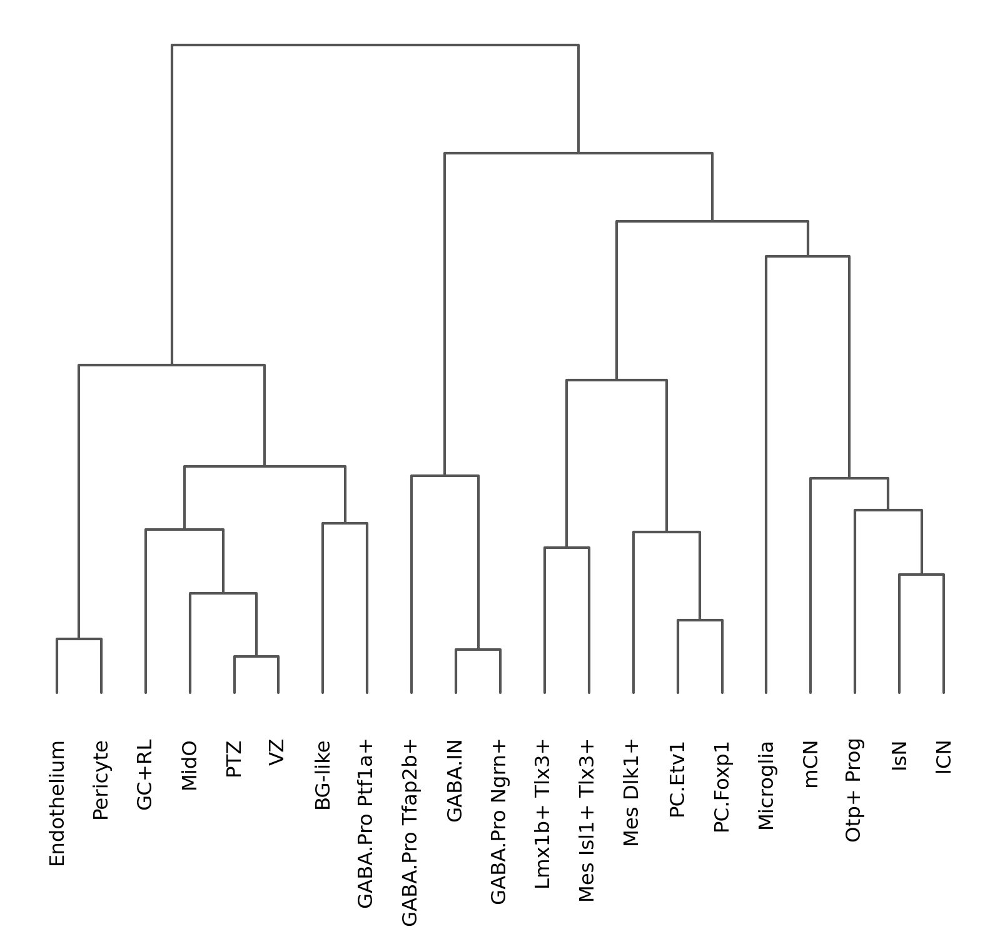

In [109]:
with plt.rc_context():  # Use this to set figure params like size and dpi    
    plt.rcParams['figure.figsize'] = 10, 7.5
    sc.pl.dendrogram(adata, "refinedCelltypes", show=False)
    plt.savefig("analysis/plots/annotation/dendogram.jpg", bbox_inches="tight")

## See if the proportion of cells assigned to any of these clusters and cell types change between KO and WT

Cell Types

In [141]:
gb = adata.obs.groupby(["refinedCelltypes", "ID"]).size()
counts = adata.obs.groupby(["refinedCelltypes", "ID"]).size().to_frame('count')
counts['prop'] = gb / gb.groupby(level=1).sum()
counts = counts.reset_index().pivot(index='refinedCelltypes', columns='ID', values="prop")
counts["diff"] = ( counts["KO"] - counts["WT"] ) / counts["WT"] 
counts = counts.sort_values("diff", ascending=False)
counts

ID,KO,WT,diff
refinedCelltypes,,,
Lmx1b+ Tlx3+,0.045647,0.024361,0.873790
Microglia,0.002274,0.001218,0.867122
BG-like,0.018843,0.012006,0.569464
GABA.Pro Tfap2b+,0.086745,0.057769,0.501571
Otp+ Prog,0.064165,0.046807,0.370842
PC.Foxp1,0.128005,0.107708,0.188442
IsN,0.050357,0.044893,0.121720
lCN,0.093730,0.085610,0.094847
Pericyte,0.007635,0.007134,0.070179


Plot these cell type changes

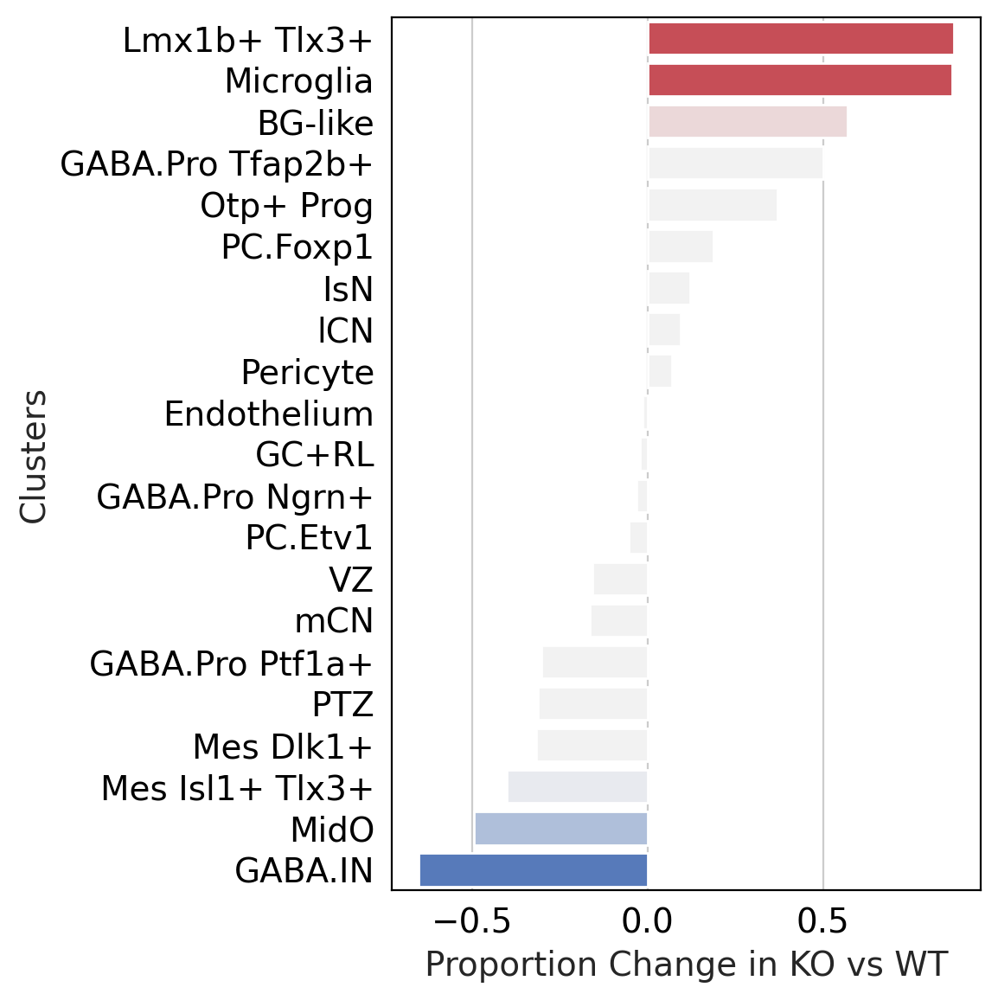

In [102]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

vcenter = 0
vmin, vmax = counts["diff"].min(), counts["diff"].max()
normalize = mcolors.TwoSlopeNorm(vcenter=vcenter, vmin=vmin, vmax=vmax)
counts["cols"] = normalize(counts["diff"])

with plt.rc_context():  # Use this to set figure params like size and dpi    
    plt.rcParams['figure.figsize'] = 6, 6
    ax = sns.barplot(counts, x = "diff", y = counts.index, hue="diff", order=counts.index, palette=sns.diverging_palette(255, 10, as_cmap=True, sep=150), hue_norm=normalize)
    ax.legend_.remove()
    plt.xlabel('Proportion Change in KO vs WT')
    plt.ylabel('Clusters')
    plt.tight_layout()
    plt.savefig("analysis/plots/annotation/clusterPrevalance.jpg")

Clusters

In [103]:
gb = adata.obs.groupby(["iterativeLeiden", "ID"]).size()
counts = adata.obs.groupby(["iterativeLeiden", "ID"]).size().to_frame('count')
counts['prop'] = gb / gb.groupby(level=1).sum()
counts = counts.reset_index().pivot(index='iterativeLeiden', columns='ID', values="prop")
counts["diff"] = ( counts["KO"] - counts["WT"] ) / counts["WT"] 
counts

ID,KO,WT,diff
iterativeLeiden,,,
0_0,0.128005,0.107708,0.188442
0_1,0.115010,0.121629,-0.054419
0_3,0.022742,0.033235,-0.315715
1_0,0.064165,0.046807,0.370842
1_1,0.050357,0.044893,0.121720
1_2,0.048895,0.043675,0.119529
1_3,0.044834,0.041935,0.069140
1_4,0.032814,0.039673,-0.172898
1_5,0.045647,0.024361,0.873790


## Marker gene dotplot

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


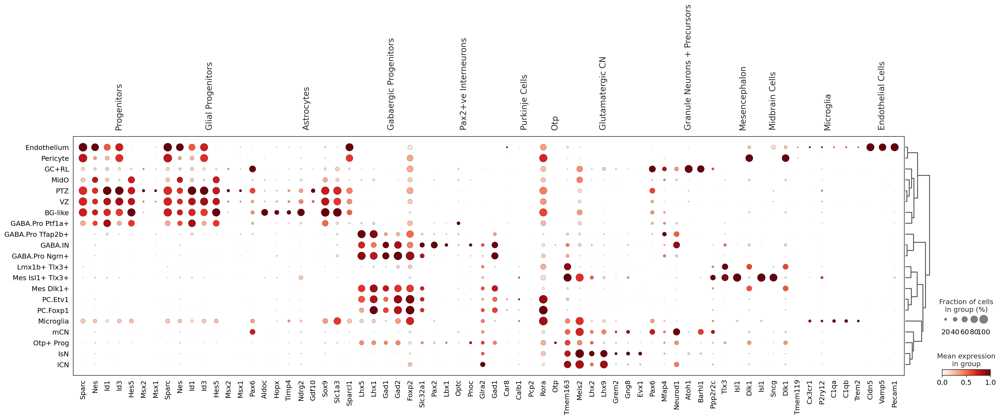

In [104]:
adata.obs["refinedCelltypes"] = adata.obs["refinedCelltypes"].astype("category")
sc.tl.dendrogram(adata, "refinedCelltypes")
with plt.rc_context():  # Use this to set figure params like size and dpi    
    plt.rcParams['figure.figsize'] = 10, 7.5
    sc.pl.dotplot(adata, markersDict, groupby="refinedCelltypes", log=True, standard_scale="var", dendrogram=True, show=False)
    plt.savefig("analysis/plots/annotation/markerDotplot.jpg", bbox_inches="tight")

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


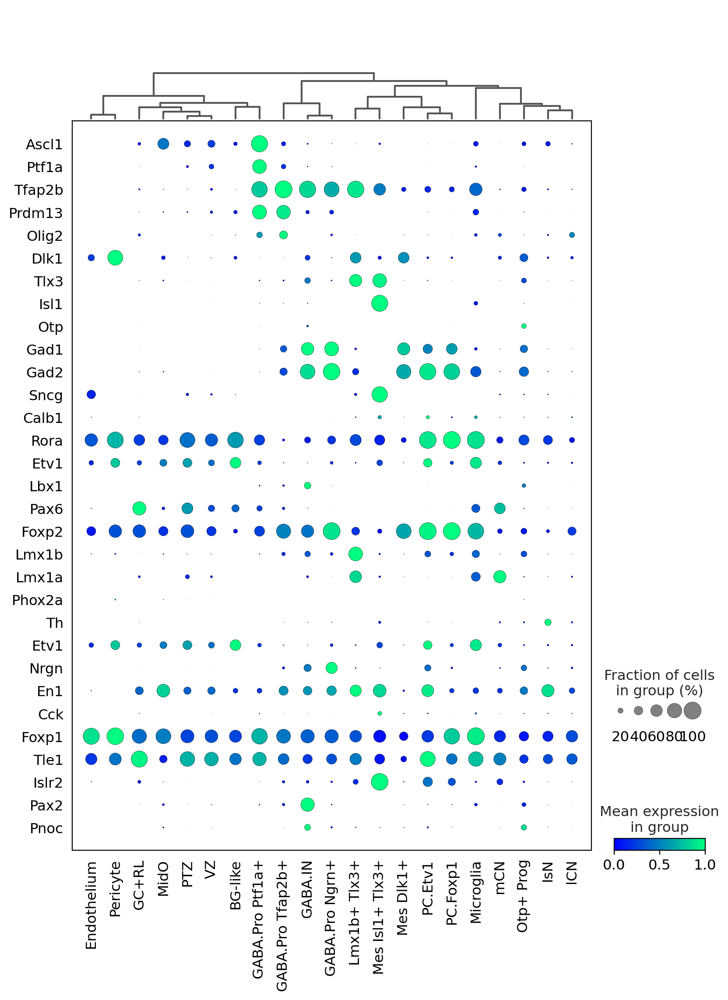

In [105]:
sc.pl.DotPlot(adata, ["Ascl1", "Ptf1a","Tfap2b", "Prdm13", "Olig2","Dlk1", "Tlx3","Isl1", "Otp", "Gad1", "Gad2", "Sncg", "Calb1", "Rora", "Etv1", "Lbx1", "Pax6","Foxp2", "Lmx1b","Lmx1a","Phox2a","Th", "Etv1", "Nrgn", "En1", "Cck", "Foxp1", "Tle1", "Islr2", "Pax2", "Pnoc"], groupby="refinedCelltypes", log=True, standard_scale="var").swap_axes().add_dendrogram().show()

/home/andy/bioinformatics/projects/DaniSC/code/analysis/scverse_venv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


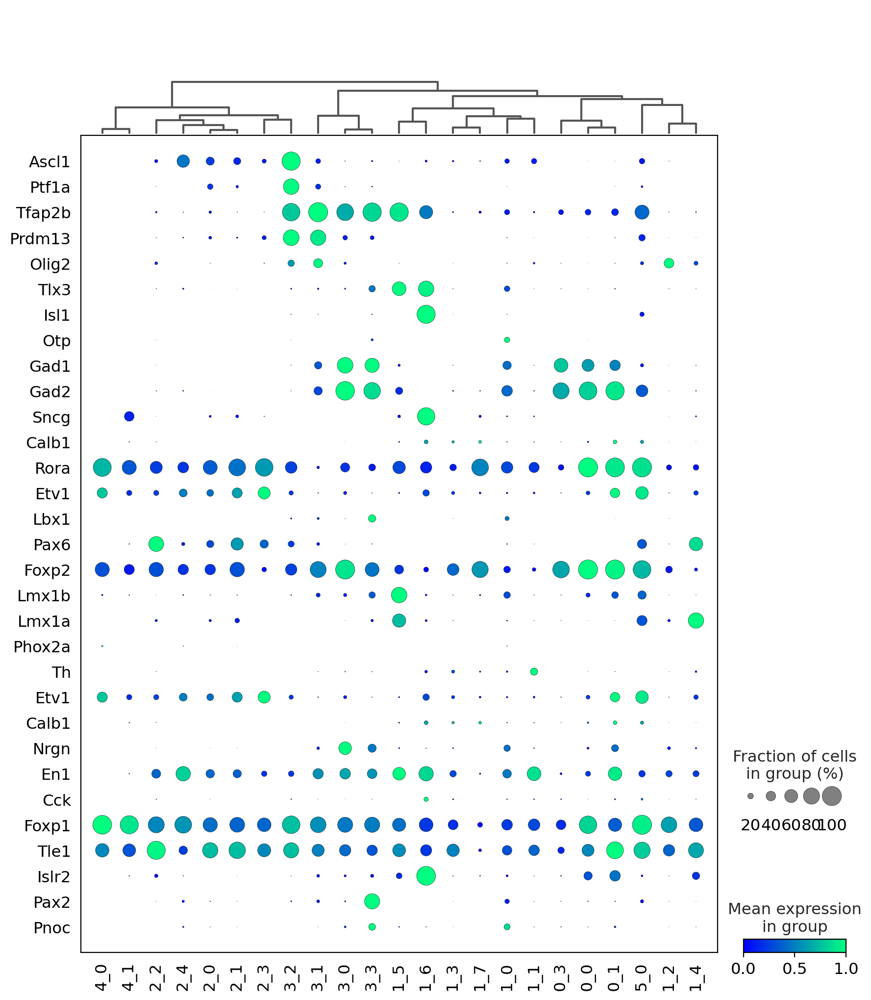

In [106]:
sc.tl.dendrogram(adata, "iterativeLeiden")
sc.pl.DotPlot(adata, ["Ascl1", "Ptf1a","Tfap2b", "Prdm13", "Olig2", "Tlx3","Isl1", "Otp", "Gad1", "Gad2", "Sncg", "Calb1", "Rora", "Etv1", "Lbx1", "Pax6","Foxp2", "Lmx1b","Lmx1a","Phox2a","Th", "Etv1","Calb1", "Nrgn", "En1", "Cck", "Foxp1", "Tle1", "Islr2", "Pax2", "Pnoc"], groupby="iterativeLeiden", log=True, standard_scale="var").swap_axes().add_dendrogram().show()

## Return to raw counts

In [110]:
adata.X = adata.layers["counts"]
del adata.layers["counts"]

### Save object

In [111]:
adata.write("analysis/objects/postQC.h5ad")